In [1]:
%store -r model_list
%store -r new_model_list

In [93]:
from PIL import Image
import PIL
import os
import torch
torch.backends.cudnn.benchmark = True
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import random
from torchvision import transforms
import torchvision.datasets as dset
import numpy as np
from tqdm import tqdm
import imagehash
import shutil
import cv2
import matplotlib.pyplot as plt
import math
from glob import glob
import gc
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure

ModuleNotFoundError: No module named 'torchmetrics'

In [2]:
!python --version

Python 3.11.9


In [3]:
source_directory = "./data/Humans"
destination_directory = "./data/Faces_Cleaned/Base"
organic_mask_directory = "./data/VOC_2012_masks"


In [4]:
image_paths = [f for f in glob(os.path.join(destination_directory, "*.*")) 
               if os.path.isfile(f) and f.lower().endswith(".jpg")]
organic_mask_list = image_paths = [f for f in glob(os.path.join(organic_mask_directory, "*.*")) 
               if os.path.isfile(f) and f.lower().endswith(".png")]
print(len(organic_mask_list))

2901


In [5]:
organic_mask_list = image_paths = [f for f in glob(os.path.join(organic_mask_directory, "*.*")) 
               if os.path.isfile(f) and f.lower().endswith(".png")]
len(organic_mask_list)

#k = 0
for path in organic_mask_list:
    #k+=1
    #print(k, end = " ")
    image_size = (224,224)
    width, height = image_size
    random_mask_path = path
    random_mask_unsized = cv2.imread(random_mask_path)
    random_mask_resized = cv2.resize(random_mask_unsized, image_size)
    #print(np.unique(random_mask_resized))
    
    binary_mask_resized = np.zeros(image_size)
    binary_mask_resized[np.any(random_mask_resized > 5, axis = 2)] = 1
    current_mask_area = np.count_nonzero(binary_mask_resized)
    eroded_pixel_test = max(int(current_mask_area * .3), 0)
    dilated_pixel_test = min(int(current_mask_area * 1.3), width*height)
    
    #https://www.geeksforgeeks.org/python-opencv-cv2-erode-method/
    mask = np.copy(binary_mask_resized)
    kernel = np.ones((3, 3), np.uint8)
    
    
    new_mask_area = 0
    type_of_transformation = None
    i = 0
    if(current_mask_area > eroded_pixel_test):
        #print("Erosion neccesary")
        new_mask_area = current_mask_area 
        while (new_mask_area > eroded_pixel_test) & (i <= 1000):
            i+=1
            mask = cv2.erode(mask, kernel)
            new_mask_area = np.count_nonzero(mask)
            #print("Iteration", i)
            
        
    j = 0    
    if(current_mask_area < dilated_pixel_test):
        #print("Dilation neccesary")
        new_mask_area = current_mask_area
        while (new_mask_area < dilated_pixel_test) & (j <= 1000):
            j+=1
            mask = cv2.dilate(mask, kernel)
            new_mask_area = np.count_nonzero(mask)
            #print("Iteration", i)
    occluded_pixel_amount = None
    if((i == 1001) or (j == 1001)):
        if i == 1001 and j == 1001: 
            occluded_pixel_amount = [eroded_pixel_test, dilated_pixel_test]
            type_of_transformation = "Dilation and Erosion"
        elif i == 1001:
            occluded_pixel_amount = eroded_pixel_test
            type_of_transformation = "Erosion"
        elif j == 1001:
            occluded_pixel_amount = dilated_pixel_test
            type_of_transformation = "Dilation"
        #fig, axes = plt.subplots(1, 1, figsize=(15, 5))
        print(f"Error with {type_of_transformation}. Old mask area: {current_mask_area}, Needed mask area {occluded_pixel_amount}, path name {random_mask_path}")
        print("Removing file to ensure working masks for later")
        os.remove(random_mask_path)

KeyboardInterrupt: 

In [6]:

def create_square_mask(image_size, occlusion_percentage):
    width, height = image_size
    mask_area = int(width * height * occlusion_percentage)
    side_length = int(np.sqrt(mask_area))
    side_length = min(side_length, width, height)
    
    start_x = (width - side_length) // 2
    start_y = (height - side_length) // 2
    
    mask = np.zeros((height, width), dtype=np.uint8)
    mask[start_y:start_y + side_length, start_x:start_x + side_length] = 1
    
    return mask

# Function to create multiple small square masks
def create_multiple_square_masks(image_size, occlusion_percentage):
    width, height = image_size
    mask_area = int(width * height * occlusion_percentage)
    
    mask = np.zeros((height, width), dtype=np.uint8)
    
    area_covered = 0
    while area_covered < mask_area:
        side_length = random.randint(5, 20)
        x = random.randint(0, width - side_length)
        y = random.randint(0, height - side_length)
        
        mask[y:y + side_length, x:x + side_length] = 1
        area_covered += side_length * side_length
    
    return mask
def create_organic_masks(image_size, occlusion_percentage):
    width, height = image_size
    random_mask_path = organic_mask_list[random.randint(0, len(organic_mask_list)-1)]
    random_mask_unsized = cv2.imread(random_mask_path)
    random_mask_resized = cv2.resize(random_mask_unsized, image_size)
    #print(np.unique(random_mask_resized))
    
    binary_mask_resized = np.zeros(image_size)
    binary_mask_resized[np.any(random_mask_resized >= 20, axis = 2)] = 1
    occluded_pixel_amount = int((width*height)*occlusion_percentage)
    current_mask_area = np.count_nonzero(binary_mask_resized)
    
    #https://www.geeksforgeeks.org/python-opencv-cv2-erode-method/
    mask = np.copy(binary_mask_resized)
    kernel = np.ones((3, 3), np.uint8)
    
    
    new_mask_area = 0
    type_of_transformation = None
    i = 0
    if(current_mask_area > occluded_pixel_amount):
        #print("Erosion neccesary")
        new_mask_area = current_mask_area 
        type_of_transformation = "Erosion"
        while (new_mask_area > occluded_pixel_amount) & (i <= 1000):
            i+=1
            mask = cv2.erode(mask, kernel)
            new_mask_area = np.count_nonzero(mask)
            #print("Iteration", i)
            
        
        
    elif(current_mask_area < occluded_pixel_amount):
        #print("Dilation neccesary")
        new_mask_area = current_mask_area
        type_of_transformation = "Dilation"
        while (new_mask_area < occluded_pixel_amount) & (i <= 1000):
            i+=1
            mask = cv2.dilate(mask, kernel)
            new_mask_area = np.count_nonzero(mask)
            #print("Iteration", i)
    else:
        #print("No change neccesary")
        mask = mask
    if(i == 1001):
        fig, axes = plt.subplots(1, 1, figsize=(15, 5))
        axes.imshow(binary_mask_resized*255,cmap = "grey")
        axes.set_title("Faulty Mask")
        axes.axis('off')
        raise RuntimeError(f"Error with {type_of_transformation}. Old mask area: {current_mask_area}, Needed mask area {occluded_pixel_amount}, current mask area {new_mask_area}, path name {random_mask_path}")
    return mask
    
    
    
                                
'''
# Function to create an irregular VOC2012-like mask
def create_irregular_mask(image_size, occlusion_percentage):
    width, height = image_size
    mask_area = int(width * height * occlusion_percentage)
    
    mask = np.ones((height, width), dtype=np.uint8)
    
    while mask_area > 0:
        shape_type = random.choice(["rectangle", "ellipse"])
        if shape_type == "rectangle":
            rect_width = random.randint(20, 50)
            rect_height = random.randint(20, 50)
            x = random.randint(0, width - rect_width)
            y = random.randint(0, height - rect_height)
            mask[y:y+rect_height, x:x+rect_width] = 0
            mask_area -= rect_width * rect_height
        else:
            rect_width = random.randint(20, 50)
            rect_height = random.randint(20, 50)
            x = random.randint(0, width - rect_width)
            y = random.randint(0, height - rect_height)
            rr, cc = np.ellipse(x + rect_width//2, y + rect_height//2, rect_width//2, rect_height//2, shape=mask.shape)
            mask[rr, cc] = 0
            mask_area -= rect_width * rect_height
    
    return mask
'''


# Custom Dataset Class for Inpainting (Return 9 Variations per Image)
class CustomInpaintingDataset(Dataset):
    def __init__(self, image_paths, occlusion_percentages=[0.10, 0.15, 0.25], transform=None):
        """
        :param image_paths: List of paths to images
        :param occlusion_percentages: List of occlusion percentages (e.g., 0.10, 0.25, 0.50)
        :param transform: Optional transform for the image
        """
        self.image_paths = image_paths
        self.occlusion_percentages = occlusion_percentages
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths) * len(self.occlusion_percentages) * 3  # 3 mask types
    
    def __getitem__(self, idx):
        
        img_idx = idx // (len(self.occlusion_percentages) * 3)
        mask_idx = idx % (len(self.occlusion_percentages) * 3)
        
        
        image = Image.open(self.image_paths[img_idx]).convert("RGB")
        width, height = image.size
        if self.transform:
            image = self.transform(image)
        else:
            
            to_tensor = transforms.ToTensor()
            image = to_tensor(image)

        to_pil = transforms.ToPILImage()

        # Make sure the tensor is in the correct shape (C, H, W)
        image= to_pil(image) 
        
        occlusion_percentage = self.occlusion_percentages[mask_idx % len(self.occlusion_percentages)]
        
        if mask_idx < 3:
            mask = create_square_mask((width, height), occlusion_percentage)  # Center square mask
        elif mask_idx < 6:
            mask = create_multiple_square_masks((width, height), occlusion_percentage)  # Multiple small squares
        else:
            mask = create_organic_masks((width, height), occlusion_percentage)  # Irregular mask
        
        
        masked_image = np.array(image)
        masked_image[mask == 1] = 0
        
        
        masked_image = Image.fromarray(masked_image)

        
        to_tensor = transforms.ToTensor()
        image = to_tensor(image)
        masked_image = to_tensor(masked_image)
        """
        if self.transform:
            image = self.transform(image)
            masked_image = self.transform(masked_image)
        else:
            
            to_tensor = transforms.ToTensor()
            image = to_tensor(image)
            masked_image = to_tensor(masked_image)
        """
        
        return masked_image, image, torch.tensor(mask, dtype=torch.float32)






In [8]:
image_paths = [f for f in glob(os.path.join(destination_directory, "*.*")) 
               if os.path.isfile(f) and f.lower().endswith(".jpg")]


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip()
    
])
#transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),

full_dataset = CustomInpaintingDataset(image_paths, occlusion_percentages=[0.10, 0.15, 0.25], transform = transform)
train_size = int(0.8 * len(full_dataset))
val_size = int(0.1 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset,
    [train_size,val_size, test_size]
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, pin_memory=True)

print(len(train_loader))
print(len(val_loader))
print(len(test_loader))

475
60
60


In [7]:

def tensor_to_image(tensor):
    image = tensor.permute(1, 2, 0).numpy()
    # Clip values to the valid range for images (0-255)
    image = np.clip(image, 0, 1)
    image = (image * 255).astype(np.uint8)
    return image

"""
def reverse_normalization(tensor, mean, std):
    
    Reverse the normalization by multiplying by std and adding mean.
    Args:
        tensor: Tensor of shape (C, H, W)
        mean: Mean for each channel (C,)
        std: Std for each channel (C,)
    Returns:
        tensor: Denormalized tensor
    
    mean = torch.tensor(mean).view(3, 1, 1)  # Make mean shape (C, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)    # Make std shape (C, 1, 1)
    
    # Reverse the normalization
    tensor = tensor * std + mean
    return tensor
"""

"""
def tensor_to_image(tensor, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    
    #Converts a tensor to a NumPy image after reversing normalization.
    
    
    # Reverse normalization
    tensor = reverse_normalization(tensor, mean, std)
    
    # Ensure the values are in the valid range [0, 1] before converting
    tensor = tensor.clamp(0, 1)  # Clamping the tensor values in the [0, 1] range
    
    # Convert from Tensor (C, H, W) to (H, W, C) and then to a NumPy array
    image = tensor.permute(1, 2, 0).numpy()
    
    # Convert values to the range [0, 255]
    image = np.clip(image, 0, 1)  # Ensure the values are within [0, 1]
    image = (image * 255).astype(np.uint8)  # Convert to 8-bit per channel
    
    return image
"""
print(len(train_loader))
for masked_images, ground_truth_images, masks in train_loader:
    for i in range(masked_images.shape[0]):
        print(f"Masked Image shape: {masked_images.shape}, Ground Truth shape: {ground_truth_images.shape}, Mask shape: {masks.shape}")
        masked_image = tensor_to_image(masked_images[i])
        ground_truth_image = tensor_to_image(ground_truth_images[i])
        mask = masks[i].numpy()  # Mask is in shape (H, W), no need to permute
        
        # Plot the images
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
        # Display masked image
        axes[0].imshow(masked_image)
        axes[0].set_title("Masked Image")
        axes[0].axis('off')
    
        # Display ground truth image
        axes[1].imshow(ground_truth_image)
        axes[1].set_title("Ground Truth Image")
        axes[1].axis('off')
    
        # Display mask (mask is a binary image, so display it as grayscale)
        axes[2].imshow(mask, cmap='gray')
        axes[2].set_title("Mask")
        axes[2].axis('off')
    
        plt.show()
    #Only 1 batch
    break;
    

NameError: name 'train_loader' is not defined

In [9]:
# Custom ResNet34 Block
class ResNetBlock(nn.Module):
    def __init__(self, in_channel, out_channel, padding, downsample, batch_norm):
        super(ResNetBlock, self).__init__()
        if(downsample):
            temp_stride = 2
        else:
            temp_stride = 1
        self.batchnorm_bool = batch_norm
        self.outchannel = out_channel
        
        
        self.conv_a = nn.Conv2d(in_channel, out_channel, kernel_size = (3,3), stride = temp_stride, padding = padding)
        nn.init.kaiming_normal_(self.conv_a.weight, mode='fan_out', nonlinearity='relu')

        self.conv_b = nn.Conv2d(out_channel, out_channel, kernel_size = (3,3), stride = 1, padding = padding)
        nn.init.kaiming_normal_(self.conv_b.weight, mode='fan_out', nonlinearity='relu')

        self.conv_short = nn.Conv2d(in_channel, out_channel, kernel_size = (1,1),  stride = temp_stride)
        nn.init.kaiming_normal_(self.conv_short.weight, mode='fan_out', nonlinearity='relu')

        self.relu = nn.ReLU(inplace=True)
        self.batchnorm_a = nn.BatchNorm2d(out_channel)
        self.batchnorm_b = nn.BatchNorm2d(out_channel)
        self.batchnorm_short = nn.BatchNorm2d(out_channel)
        
        
        
    def forward(self, x):
        old_x = x
        
        a_output=self.conv_a(x)
        if self.batchnorm_bool: a_output=self.batchnorm_a(a_output)
        a_output = self.relu(a_output)
        
        b_output = self.conv_b(a_output)
        if self.batchnorm_bool: b_output=self.batchnorm_b(b_output)
        b_output = self.relu(b_output)
        
        if(self.outchannel == 64):
            residual =  x
        else:
            residual =  self.conv_short(old_x)
        if self.batchnorm_bool: residual=self.batchnorm_short(residual)
        #print(b_output.size())
        #print(residual.size())
        out = self.relu(b_output + residual)
        return out



class ChannelWiseFullyConnected(nn.Module):
    def __init__(self, channels, height, width):
        super(ChannelWiseFullyConnected, self).__init__()
        self.channels = channels
        self.height = height
        self.width = width
        self.num_features = height * width
        
        # One independent linear layer per channel (each maps n^2 -> n^2)
        self.fc_layers = nn.ModuleList([
            nn.Linear(self.num_features, self.num_features) for _ in range(channels)
        ])
    
    def forward(self, x):
        # x shape: [batch_size, channels, height, width]
        batch_size = x.size(0)
        
        out = []
        for c in range(self.channels):
            # Flatten H x W into a vector
            channel = x[:, c, :, :].view(batch_size, -1)
            # Apply channel-specific FC layer
            channel_fc = self.fc_layers[c](channel)
            # Reshape back to H x W
            channel_fc = channel_fc.view(batch_size, self.height, self.width)
            out.append(channel_fc.unsqueeze(1))  # add back channel dim
        
        # Concatenate channels back: shape [batch_size, channels, height, width]
        return torch.cat(out, dim=1)


# Custom ResNet34 Encoder (Manual Implementation)
class ResNetEncoder(nn.Module):
    def __init__(self, latent_dim=512):
        super(ResNetEncoder, self).__init__()

         # Encoder (Rest 
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        """
        self.rest_of_encoder = nn.Sequential(
            #CONV LAYER 2
            ResNetBlock(64, 64, 1, True, True),
            ResNetBlock(64, 64, 1, False, True),
            ResNetBlock(64, 64, 1, False, True),
    
            #CONV LAYER 3
            ResNetBlock(64, 128, 1, True, True),
            ResNetBlock(128, 128, 1, False, True),
            ResNetBlock(128, 128, 1, False, True),
            ResNetBlock(128, 128, 1, False, True),
    
            #CONV LAYER 4
            ResNetBlock(128, 256, 1, True, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
    
            #CONV LAYER 5
            ResNetBlock(256, 512, 1, True, True),
            ResNetBlock(512, 512, 1, False, True),
            ResNetBlock(512, 512, 1, False, True),
        )
        """
        
        """
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        """
        # ResNet34 layers

        #CONV LAYER 2
        self.conv2_1 = ResNetBlock(64, 64, 1, False, True)
        self.conv2_2 = ResNetBlock(64, 64, 1, False, True)
        self.conv2_3 = ResNetBlock(64, 64, 1, False, True)

        #CONV LAYER 3
        self.conv3_1 = ResNetBlock(64, 128, 1, True, True)
        self.conv3_2 = ResNetBlock(128, 128, 1, False, True)
        self.conv3_3 = ResNetBlock(128, 128, 1, False, True)
        self.conv3_4 = ResNetBlock(128, 128, 1, False, True)

        #CONV LAYER 4
        self.conv4_1 = ResNetBlock(128, 256, 1, True, True)
        self.conv4_2 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_3 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_4 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_5 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_6 = ResNetBlock(256, 256, 1, False, True)

        #CONV LAYER 5
        self.conv5_1 = ResNetBlock(256, 512, 1, True, True)
        self.conv5_2 = ResNetBlock(512, 512, 1, False, True)
        self.conv5_3 = ResNetBlock(512, 512, 1, False, True)
        
        
        self.channel_fc = ChannelWiseFullyConnected(channels=512, height=7, width=7)
        self.conv_fc = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0)
        
        
        
        # Decoder (Upsampling to reconstruct image)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Output range [0,1]
        )
    
    def forward(self, x):
        # Encoder
        #print(x.size())
        x = self.conv1(x)
        #print(x.size())
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        #print(x.size())
        layer_2 = self.conv2_3(self.conv2_2(self.conv2_1(x)))
        layer_3 = self.conv3_4(self.conv3_3(self.conv3_2(self.conv3_1(layer_2))))
        layer_4 = self.conv4_6(self.conv4_5(self.conv4_4(self.conv4_3(self.conv4_2(self.conv4_1(layer_3))))))
        layer_5 = self.conv5_3(self.conv5_2(self.conv5_1(layer_4)))
        #raise RuntimeError(f"{layer_5.size()}")
        #x = self.rest_of_encoder(x)
        cfc = self.conv_fc(self.channel_fc(layer_5))
        # Decoder
        out = self.decoder(cfc)  # Convert features back to an image
        return out


In [10]:
#As defined within the paper

class ReconstructionLoss(nn.Module):
    def __init__(self):
        super(ReconstructionLoss, self).__init__()

    def forward(self, output, ground_truth, mask):
        # output is F((1 - M_hat) * x)
        # ground_truth is x
        # mask is M_hat
        
        # Convert mask to float, if not already
        mask = mask.float()

        # Expand mask to 3 channels to match output and ground_truth
        mask_3ch = mask.unsqueeze(1).repeat(1, 3, 1, 1)

        # Compute the error
        error = ground_truth - output

        # Apply the mask
        masked_out_error = mask_3ch * error

        # Sum over masked pixels
        pixel_amount = mask_3ch.sum()

        # Compute squared L2 norm
        squared_l2_norm = torch.sum(masked_out_error ** 2)

        # Normalize, add epsilon for numerical stability
        return squared_l2_norm / (pixel_amount + 1e-8)

In [11]:
if torch.cuda.is_available():
    device_count = torch.cuda.device_count()
    print(f"CUDA is available. Number of GPUs: {device_count}")
    for i in range(device_count):
        gpu_name = torch.cuda.get_device_name(i)
        print(f"GPU {i}: {gpu_name}")
else:
    print("CUDA is not available.")

print(torch.version.cuda)
print(torch.cuda.is_available())


CUDA is available. Number of GPUs: 1
GPU 0: NVIDIA GeForce RTX 3070 Laptop GPU
12.1
True


In [12]:
model_path_dir = "./model_paths/"
os.path.isdir("./model_paths/")

True

In [63]:
# Initialize model (Make sure ResNetEncoder is already defined)
def train_RESNET_ENCODER(lr, epochs, batch_size, add_to_path_string = ""):   
    torch.cuda.empty_cache()
    gc.collect()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    #print(device)
    model = ResNetEncoder().to(device)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    # Define loss function and optimizer
    criterion = ReconstructionLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)  # Now model exists
    train_losses = []
    validation_losses = []

    #dataset = CustomInpaintingDataset(image_paths, occlusion_percentages=[0.10, 0.25, 0.50], transform=transform)

    # Create DataLoader
    #dataloader = DataLoader(dataset, batch_size=16, shuffle=True)
    # Training loop
    # Adjust based on dataset
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        epoch_val_loss = 0
        progress_bar_string = f"Progress on Epoch {epoch+1}"
        for masked_images, ground_truth_images, masks in tqdm(train_loader, desc = progress_bar_string):  
            
            masked_images, ground_truth_images, masks = (
                masked_images.to(device, non_blocking=True), 
                ground_truth_images.to(device, non_blocking=True), 
                masks.to(device, non_blocking=True)  # Move masks to device
            )

            optimizer.zero_grad()

            training_outputs = model(masked_images)  # Forward pass
            training_loss = criterion(training_outputs, ground_truth_images, masks)  # Compute loss 
            training_loss.backward()  # Backpropagation
            optimizer.step()  # Update weights
            epoch_loss += training_loss.item()
            

            
        model.eval()  # Set model to evaluation mode
        
            # Grab the next validation batch
        
        for val_inputs, val_ground_truths, val_masks in val_loader:
            val_inputs = val_inputs.to(device, non_blocking = True)
            val_ground_truths = val_ground_truths.to(device, non_blocking=True)
            val_masks = val_masks.to(device, non_blocking=True)

            
            with torch.no_grad():
                val_outputs = model(val_inputs)
                val_loss = criterion(val_outputs, val_ground_truths, val_masks)
            epoch_val_loss += val_loss.item()

        model.train()
        print(f"Epoch [{epoch+1}/{epochs}], Training Loss: {epoch_loss/len(train_loader):.4f}, Validation Loss: {epoch_val_loss/len(val_loader):.4f}")
        train_losses.append(epoch_loss/len(train_loader))
        validation_losses.append(epoch_val_loss/len(val_loader))

    print("Training Complete!")

    
    

    fig, ax = plt.subplots(1, 1, figsize=(12, 5))

    epoch_range = range(1, epochs+1)
    # Plot Training Loss
    ax.plot(epoch_range, train_losses, label='Training Loss', color = "blue")
    ax.plot(epoch_range, validation_losses, label='Validation Loss', color = "orange")
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.set_title('Training and Validation Loss Curve')
    ax.legend()

    plt.show()
    
    """
    axes[0].plot(epoch_range, train_losses, label='Training Loss', color='blue')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].set_title(f'Training Loss Curve (B: {batch_size}, E: {epochs}, LR: {lr})')
    axes[0].legend()

    # Plot Validation Loss
    axes[1].plot(epoch_range, validation_losses, label='Validation Loss', color='orange')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].set_title(f'Training Loss Curve (B: {batch_size}, E: {epochs}, LR: {lr})')
    axes[1].legend()
    """
    #plt.tight_layout()  # Adjust spacing to prevent overlap
    #plt.show()
    model_path = os.path.join(model_path_dir, f"resnet34{add_to_path_string}_lr{lr}_epoch{epoch}_batch{batch_size}_trial.pth")
    checkpoint = {
        'epoch': epochs,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': train_losses,
        'val_loss': validation_losses,
        'hyperparameters': {
            'lr': lr,
            'batch_size': batch_size,
            # add more if needed
        }
    }
    torch.save(checkpoint, model_path)
    print(f"Model saved to {model_path}, cleaning required")
    del model
    del optimizer
    del train_loader
    del val_loader
    del masked_images
    del ground_truth_images
    del masks
    del val_inputs
    del val_ground_truths
    del val_masks
    torch.cuda.empty_cache()
    gc.collect()

    return train_losses[-1], validation_losses[-1], model_path


Trial 1 with parameters batch_size: 32, lr: 0.0005, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [1/10], Training Loss: 0.0291, Validation Loss: 0.0245


Progress on Epoch 2: 100%|██████████| 475/475 [04:32<00:00,  1.74it/s]


Epoch [2/10], Training Loss: 0.0197, Validation Loss: 0.0679


Progress on Epoch 3: 100%|██████████| 475/475 [04:32<00:00,  1.74it/s]


Epoch [3/10], Training Loss: 0.0177, Validation Loss: 0.0963


Progress on Epoch 4: 100%|██████████| 475/475 [04:27<00:00,  1.77it/s]


Epoch [4/10], Training Loss: 0.0169, Validation Loss: 0.0161


Progress on Epoch 5: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [5/10], Training Loss: 0.0155, Validation Loss: 0.0153


Progress on Epoch 6: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [6/10], Training Loss: 0.0148, Validation Loss: 0.0144


Progress on Epoch 7: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [7/10], Training Loss: 0.0142, Validation Loss: 0.0137


Progress on Epoch 8: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [8/10], Training Loss: 0.0136, Validation Loss: 0.0135


Progress on Epoch 9: 100%|██████████| 475/475 [04:30<00:00,  1.75it/s]


Epoch [9/10], Training Loss: 0.0131, Validation Loss: 0.0143


Progress on Epoch 10: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [10/10], Training Loss: 0.0127, Validation Loss: 0.0137
Training Complete!


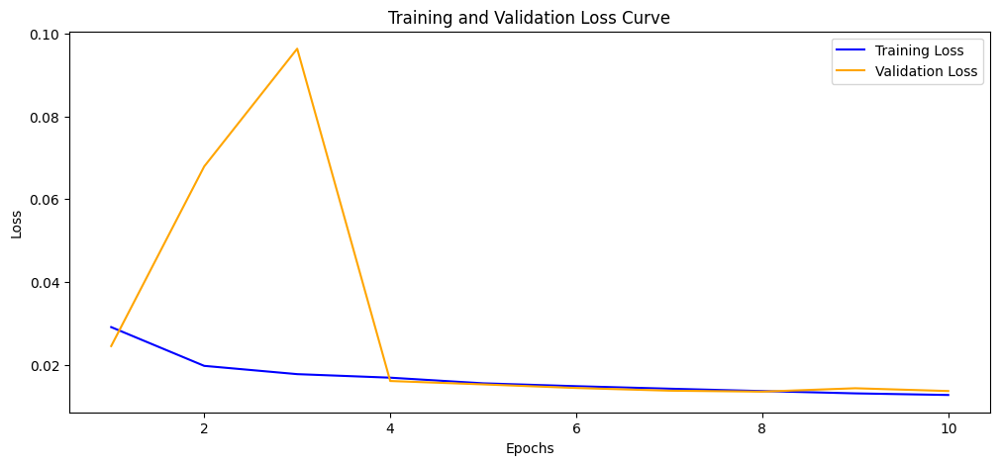

Model saved to ./model_paths/resnet34_lr0.0005_epoch9_batch32_trial.pth, cleaning required
Trial 1 complete----------------------------------------------------------------------------------------------------------------
Trial 2 with parameters batch_size: 32, lr: 0.0005, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [1/25], Training Loss: 0.0289, Validation Loss: 0.0229


Progress on Epoch 2: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [2/25], Training Loss: 0.0202, Validation Loss: 0.0192


Progress on Epoch 3: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [3/25], Training Loss: 0.0177, Validation Loss: 0.0194


Progress on Epoch 4: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [4/25], Training Loss: 0.0165, Validation Loss: 0.0157


Progress on Epoch 5: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [5/25], Training Loss: 0.0154, Validation Loss: 0.0152


Progress on Epoch 6: 100%|██████████| 475/475 [04:25<00:00,  1.79it/s]


Epoch [6/25], Training Loss: 0.0152, Validation Loss: 0.0163


Progress on Epoch 7: 100%|██████████| 475/475 [04:38<00:00,  1.70it/s]


Epoch [7/25], Training Loss: 0.0145, Validation Loss: 0.0140


Progress on Epoch 8: 100%|██████████| 475/475 [04:31<00:00,  1.75it/s]


Epoch [8/25], Training Loss: 0.0136, Validation Loss: 0.0135


Progress on Epoch 9: 100%|██████████| 475/475 [04:32<00:00,  1.75it/s]


Epoch [9/25], Training Loss: 0.0129, Validation Loss: 0.0136


Progress on Epoch 10: 100%|██████████| 475/475 [04:32<00:00,  1.75it/s]


Epoch [10/25], Training Loss: 0.0127, Validation Loss: 0.0126


Progress on Epoch 11: 100%|██████████| 475/475 [04:33<00:00,  1.74it/s]


Epoch [11/25], Training Loss: 0.0122, Validation Loss: 0.0121


Progress on Epoch 12: 100%|██████████| 475/475 [04:32<00:00,  1.74it/s]


Epoch [12/25], Training Loss: 0.0118, Validation Loss: 0.0121


Progress on Epoch 13: 100%|██████████| 475/475 [04:28<00:00,  1.77it/s]


Epoch [13/25], Training Loss: 0.0113, Validation Loss: 0.0113


Progress on Epoch 14: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [14/25], Training Loss: 0.0110, Validation Loss: 0.0116


Progress on Epoch 15: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [15/25], Training Loss: 0.0108, Validation Loss: 0.0108


Progress on Epoch 16: 100%|██████████| 475/475 [04:30<00:00,  1.76it/s]


Epoch [16/25], Training Loss: 0.0103, Validation Loss: 0.0106


Progress on Epoch 17: 100%|██████████| 475/475 [04:33<00:00,  1.74it/s]


Epoch [17/25], Training Loss: 0.0100, Validation Loss: 0.0106


Progress on Epoch 18: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [18/25], Training Loss: 0.0099, Validation Loss: 0.0104


Progress on Epoch 19: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [19/25], Training Loss: 0.0098, Validation Loss: 0.0101


Progress on Epoch 20: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [20/25], Training Loss: 0.0093, Validation Loss: 0.0104


Progress on Epoch 21: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [21/25], Training Loss: 0.0092, Validation Loss: 0.0094


Progress on Epoch 22: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [22/25], Training Loss: 0.0089, Validation Loss: 0.0094


Progress on Epoch 23: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [23/25], Training Loss: 0.0088, Validation Loss: 0.0093


Progress on Epoch 24: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [24/25], Training Loss: 0.0087, Validation Loss: 0.0091


Progress on Epoch 25: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [25/25], Training Loss: 0.0084, Validation Loss: 0.0089
Training Complete!


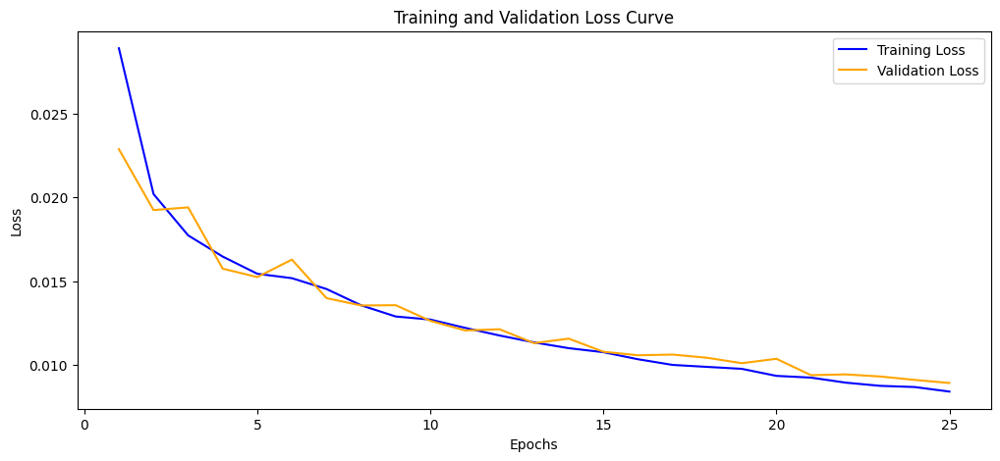

Model saved to ./model_paths/resnet34_lr0.0005_epoch24_batch32_trial.pth, cleaning required
Trial 2 complete----------------------------------------------------------------------------------------------------------------
Trial 3 with parameters batch_size: 32, lr: 0.0005, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:21<00:00,  1.81it/s]


Epoch [1/50], Training Loss: 0.0285, Validation Loss: 0.0230


Progress on Epoch 2: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [2/50], Training Loss: 0.0202, Validation Loss: 0.0187


Progress on Epoch 3: 100%|██████████| 475/475 [04:26<00:00,  1.79it/s]


Epoch [3/50], Training Loss: 0.0177, Validation Loss: 0.0175


Progress on Epoch 4: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [4/50], Training Loss: 0.0163, Validation Loss: 0.0156


Progress on Epoch 5: 100%|██████████| 475/475 [04:18<00:00,  1.83it/s]


Epoch [5/50], Training Loss: 0.0155, Validation Loss: 0.0146


Progress on Epoch 6: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [6/50], Training Loss: 0.0151, Validation Loss: 0.0152


Progress on Epoch 7: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [7/50], Training Loss: 0.0143, Validation Loss: 0.0148


Progress on Epoch 8: 100%|██████████| 475/475 [04:24<00:00,  1.80it/s]


Epoch [8/50], Training Loss: 0.0134, Validation Loss: 0.0135


Progress on Epoch 9: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [9/50], Training Loss: 0.0132, Validation Loss: 0.0136


Progress on Epoch 10: 100%|██████████| 475/475 [04:24<00:00,  1.79it/s]


Epoch [10/50], Training Loss: 0.0126, Validation Loss: 0.0127


Progress on Epoch 11: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [11/50], Training Loss: 0.0121, Validation Loss: 0.0127


Progress on Epoch 12: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [12/50], Training Loss: 0.0116, Validation Loss: 0.0121


Progress on Epoch 13: 100%|██████████| 475/475 [04:15<00:00,  1.86it/s]


Epoch [13/50], Training Loss: 0.0112, Validation Loss: 0.0114


Progress on Epoch 14: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [14/50], Training Loss: 0.0109, Validation Loss: 0.0110


Progress on Epoch 15: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [15/50], Training Loss: 0.0107, Validation Loss: 0.0108


Progress on Epoch 16: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [16/50], Training Loss: 0.0102, Validation Loss: 0.0105


Progress on Epoch 17: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [17/50], Training Loss: 0.0101, Validation Loss: 0.0107


Progress on Epoch 18: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [18/50], Training Loss: 0.0100, Validation Loss: 0.0098


Progress on Epoch 19: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [19/50], Training Loss: 0.0096, Validation Loss: 0.0100


Progress on Epoch 20: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [20/50], Training Loss: 0.0094, Validation Loss: 0.0097


Progress on Epoch 21: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [21/50], Training Loss: 0.0090, Validation Loss: 0.0101


Progress on Epoch 22: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [22/50], Training Loss: 0.0089, Validation Loss: 0.0099


Progress on Epoch 23: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [23/50], Training Loss: 0.0088, Validation Loss: 0.0091


Progress on Epoch 24: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [24/50], Training Loss: 0.0087, Validation Loss: 0.0094


Progress on Epoch 25: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [25/50], Training Loss: 0.0086, Validation Loss: 0.0090


Progress on Epoch 26: 100%|██████████| 475/475 [04:30<00:00,  1.76it/s]


Epoch [26/50], Training Loss: 0.0083, Validation Loss: 0.0087


Progress on Epoch 27: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [27/50], Training Loss: 0.0081, Validation Loss: 0.0089


Progress on Epoch 28: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [28/50], Training Loss: 0.0082, Validation Loss: 0.0086


Progress on Epoch 29: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [29/50], Training Loss: 0.0080, Validation Loss: 0.0087


Progress on Epoch 30: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [30/50], Training Loss: 0.0077, Validation Loss: 0.0082


Progress on Epoch 31: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [31/50], Training Loss: 0.0078, Validation Loss: 0.0079


Progress on Epoch 32: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [32/50], Training Loss: 0.0077, Validation Loss: 0.0080


Progress on Epoch 33: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [33/50], Training Loss: 0.0075, Validation Loss: 0.0082


Progress on Epoch 34: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [34/50], Training Loss: 0.0076, Validation Loss: 0.0084


Progress on Epoch 35: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [35/50], Training Loss: 0.0074, Validation Loss: 0.0079


Progress on Epoch 36: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [36/50], Training Loss: 0.0073, Validation Loss: 0.0087


Progress on Epoch 37: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [37/50], Training Loss: 0.0074, Validation Loss: 0.0079


Progress on Epoch 38: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [38/50], Training Loss: 0.0071, Validation Loss: 0.0077


Progress on Epoch 39: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [39/50], Training Loss: 0.0070, Validation Loss: 0.0078


Progress on Epoch 40: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [40/50], Training Loss: 0.0069, Validation Loss: 0.0089


Progress on Epoch 41: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [41/50], Training Loss: 0.0069, Validation Loss: 0.0073


Progress on Epoch 42: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [42/50], Training Loss: 0.0068, Validation Loss: 0.0074


Progress on Epoch 43: 100%|██████████| 475/475 [04:18<00:00,  1.83it/s]


Epoch [43/50], Training Loss: 0.0066, Validation Loss: 0.0074


Progress on Epoch 44: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [44/50], Training Loss: 0.0067, Validation Loss: 0.0071


Progress on Epoch 45: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [45/50], Training Loss: 0.0067, Validation Loss: 0.0073


Progress on Epoch 46: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [46/50], Training Loss: 0.0065, Validation Loss: 0.0072


Progress on Epoch 47: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [47/50], Training Loss: 0.0065, Validation Loss: 0.0070


Progress on Epoch 48: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [48/50], Training Loss: 0.0064, Validation Loss: 0.0073


Progress on Epoch 49: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [49/50], Training Loss: 0.0066, Validation Loss: 0.0072


Progress on Epoch 50: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [50/50], Training Loss: 0.0066, Validation Loss: 0.0069
Training Complete!


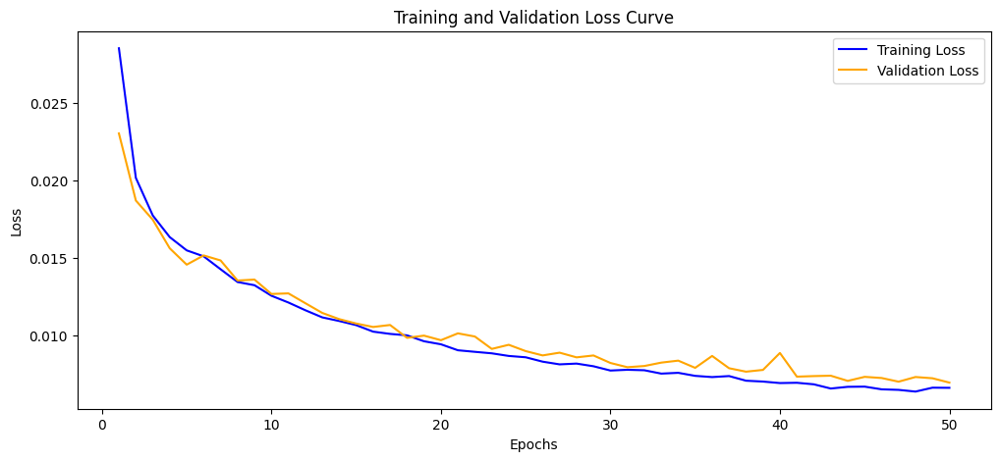

Model saved to ./model_paths/resnet34_lr0.0005_epoch49_batch32_trial.pth, cleaning required
Trial 3 complete----------------------------------------------------------------------------------------------------------------
Trial 4 with parameters batch_size: 32, lr: 0.0001, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [1/10], Training Loss: 0.0347, Validation Loss: 0.0232


Progress on Epoch 2: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [2/10], Training Loss: 0.0217, Validation Loss: 0.0200


Progress on Epoch 3: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [3/10], Training Loss: 0.0193, Validation Loss: 0.0197


Progress on Epoch 4: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [4/10], Training Loss: 0.0178, Validation Loss: 0.0173


Progress on Epoch 5: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [5/10], Training Loss: 0.0170, Validation Loss: 0.0168


Progress on Epoch 6: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [6/10], Training Loss: 0.0163, Validation Loss: 0.0160


Progress on Epoch 7: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [7/10], Training Loss: 0.0157, Validation Loss: 0.0232


Progress on Epoch 8: 100%|██████████| 475/475 [04:30<00:00,  1.75it/s]


Epoch [8/10], Training Loss: 0.0150, Validation Loss: 0.0163


Progress on Epoch 9: 100%|██████████| 475/475 [04:34<00:00,  1.73it/s]


Epoch [9/10], Training Loss: 0.0147, Validation Loss: 0.0151


Progress on Epoch 10: 100%|██████████| 475/475 [04:28<00:00,  1.77it/s]


Epoch [10/10], Training Loss: 0.0140, Validation Loss: 0.0140
Training Complete!


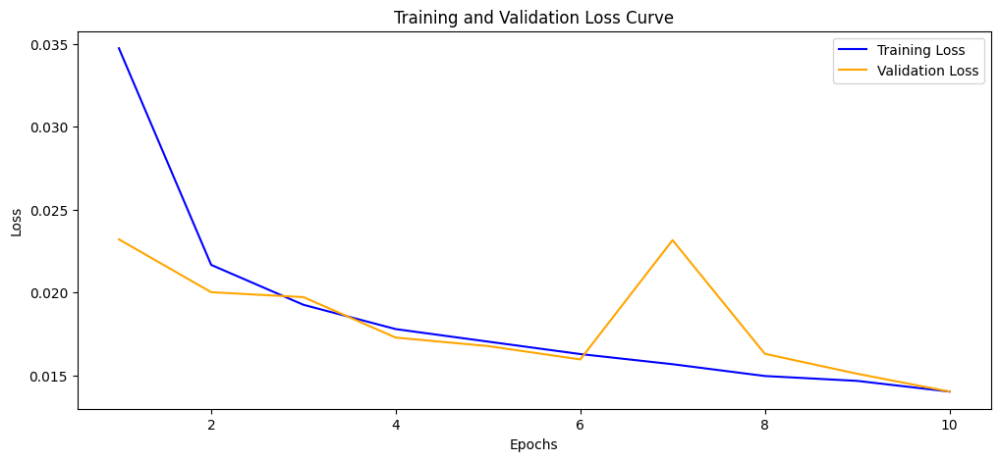

Model saved to ./model_paths/resnet34_lr0.0001_epoch9_batch32_trial.pth, cleaning required
Trial 4 complete----------------------------------------------------------------------------------------------------------------
Trial 5 with parameters batch_size: 32, lr: 0.0001, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:30<00:00,  1.76it/s]


Epoch [1/25], Training Loss: 0.0345, Validation Loss: 0.0247


Progress on Epoch 2: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [2/25], Training Loss: 0.0219, Validation Loss: 0.0196


Progress on Epoch 3: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [3/25], Training Loss: 0.0194, Validation Loss: 0.0180


Progress on Epoch 4: 100%|██████████| 475/475 [04:27<00:00,  1.77it/s]


Epoch [4/25], Training Loss: 0.0179, Validation Loss: 0.0173


Progress on Epoch 5: 100%|██████████| 475/475 [04:26<00:00,  1.78it/s]


Epoch [5/25], Training Loss: 0.0169, Validation Loss: 0.0162


Progress on Epoch 6: 100%|██████████| 475/475 [04:27<00:00,  1.78it/s]


Epoch [6/25], Training Loss: 0.0162, Validation Loss: 0.0158


Progress on Epoch 7: 100%|██████████| 475/475 [04:27<00:00,  1.77it/s]


Epoch [7/25], Training Loss: 0.0155, Validation Loss: 0.0158


Progress on Epoch 8: 100%|██████████| 475/475 [04:28<00:00,  1.77it/s]


Epoch [8/25], Training Loss: 0.0150, Validation Loss: 0.0155


Progress on Epoch 9: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [9/25], Training Loss: 0.0145, Validation Loss: 0.0145


Progress on Epoch 10: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [10/25], Training Loss: 0.0142, Validation Loss: 0.0143


Progress on Epoch 11: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [11/25], Training Loss: 0.0137, Validation Loss: 0.0138


Progress on Epoch 12: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [12/25], Training Loss: 0.0134, Validation Loss: 0.0138


Progress on Epoch 13: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [13/25], Training Loss: 0.0130, Validation Loss: 0.0132


Progress on Epoch 14: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [14/25], Training Loss: 0.0127, Validation Loss: 0.0134


Progress on Epoch 15: 100%|██████████| 475/475 [04:18<00:00,  1.83it/s]


Epoch [15/25], Training Loss: 0.0123, Validation Loss: 0.0125


Progress on Epoch 16: 100%|██████████| 475/475 [04:16<00:00,  1.85it/s]


Epoch [16/25], Training Loss: 0.0118, Validation Loss: 0.0125


Progress on Epoch 17: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [17/25], Training Loss: 0.0117, Validation Loss: 0.0118


Progress on Epoch 18: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [18/25], Training Loss: 0.0116, Validation Loss: 0.0122


Progress on Epoch 19: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [19/25], Training Loss: 0.0113, Validation Loss: 0.0115


Progress on Epoch 20: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [20/25], Training Loss: 0.0110, Validation Loss: 0.0115


Progress on Epoch 21: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [21/25], Training Loss: 0.0108, Validation Loss: 0.0113


Progress on Epoch 22: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [22/25], Training Loss: 0.0104, Validation Loss: 0.0107


Progress on Epoch 23: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [23/25], Training Loss: 0.0103, Validation Loss: 0.0114


Progress on Epoch 24: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [24/25], Training Loss: 0.0101, Validation Loss: 0.0107


Progress on Epoch 25: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [25/25], Training Loss: 0.0098, Validation Loss: 0.0105
Training Complete!


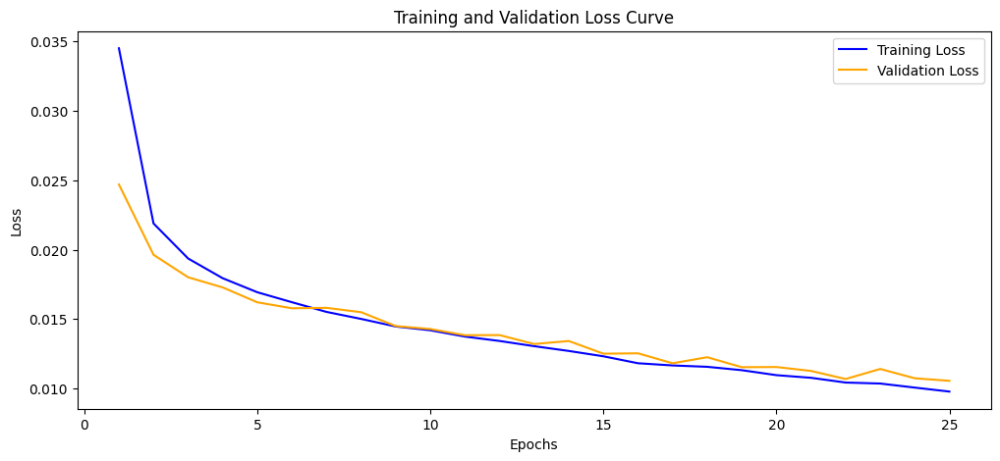

Model saved to ./model_paths/resnet34_lr0.0001_epoch24_batch32_trial.pth, cleaning required
Trial 5 complete----------------------------------------------------------------------------------------------------------------
Trial 6 with parameters batch_size: 32, lr: 0.0001, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [1/50], Training Loss: 0.0326, Validation Loss: 0.0236


Progress on Epoch 2: 100%|██████████| 475/475 [04:18<00:00,  1.83it/s]


Epoch [2/50], Training Loss: 0.0218, Validation Loss: 0.0197


Progress on Epoch 3: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [3/50], Training Loss: 0.0195, Validation Loss: 0.0188


Progress on Epoch 4: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [4/50], Training Loss: 0.0180, Validation Loss: 0.0179


Progress on Epoch 5: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [5/50], Training Loss: 0.0170, Validation Loss: 0.0167


Progress on Epoch 6: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [6/50], Training Loss: 0.0164, Validation Loss: 0.0156


Progress on Epoch 7: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [7/50], Training Loss: 0.0156, Validation Loss: 0.0153


Progress on Epoch 8: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [8/50], Training Loss: 0.0149, Validation Loss: 0.0144


Progress on Epoch 9: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [9/50], Training Loss: 0.0146, Validation Loss: 0.0143


Progress on Epoch 10: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [10/50], Training Loss: 0.0143, Validation Loss: 0.0143


Progress on Epoch 11: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [11/50], Training Loss: 0.0140, Validation Loss: 0.0136


Progress on Epoch 12: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [12/50], Training Loss: 0.0131, Validation Loss: 0.0137


Progress on Epoch 13: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [13/50], Training Loss: 0.0128, Validation Loss: 0.0131


Progress on Epoch 14: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [14/50], Training Loss: 0.0127, Validation Loss: 0.0129


Progress on Epoch 15: 100%|██████████| 475/475 [04:18<00:00,  1.83it/s]


Epoch [15/50], Training Loss: 0.0122, Validation Loss: 0.0125


Progress on Epoch 16: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [16/50], Training Loss: 0.0120, Validation Loss: 0.0124


Progress on Epoch 17: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [17/50], Training Loss: 0.0115, Validation Loss: 0.0120


Progress on Epoch 18: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [18/50], Training Loss: 0.0113, Validation Loss: 0.0116


Progress on Epoch 19: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [19/50], Training Loss: 0.0111, Validation Loss: 0.0115


Progress on Epoch 20: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [20/50], Training Loss: 0.0108, Validation Loss: 0.0122


Progress on Epoch 21: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [21/50], Training Loss: 0.0107, Validation Loss: 0.0112


Progress on Epoch 22: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [22/50], Training Loss: 0.0104, Validation Loss: 0.0111


Progress on Epoch 23: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [23/50], Training Loss: 0.0102, Validation Loss: 0.0103


Progress on Epoch 24: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [24/50], Training Loss: 0.0099, Validation Loss: 0.0104


Progress on Epoch 25: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [25/50], Training Loss: 0.0099, Validation Loss: 0.0107


Progress on Epoch 26: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [26/50], Training Loss: 0.0097, Validation Loss: 0.0099


Progress on Epoch 27: 100%|██████████| 475/475 [04:15<00:00,  1.86it/s]


Epoch [27/50], Training Loss: 0.0093, Validation Loss: 0.0100


Progress on Epoch 28: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [28/50], Training Loss: 0.0094, Validation Loss: 0.0095


Progress on Epoch 29: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [29/50], Training Loss: 0.0090, Validation Loss: 0.0094


Progress on Epoch 30: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [30/50], Training Loss: 0.0091, Validation Loss: 0.0094


Progress on Epoch 31: 100%|██████████| 475/475 [04:17<00:00,  1.84it/s]


Epoch [31/50], Training Loss: 0.0090, Validation Loss: 0.0097


Progress on Epoch 32: 100%|██████████| 475/475 [04:15<00:00,  1.86it/s]


Epoch [32/50], Training Loss: 0.0085, Validation Loss: 0.0093


Progress on Epoch 33: 100%|██████████| 475/475 [04:17<00:00,  1.85it/s]


Epoch [33/50], Training Loss: 0.0085, Validation Loss: 0.0092


Progress on Epoch 34: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [34/50], Training Loss: 0.0085, Validation Loss: 0.0090


Progress on Epoch 35: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [35/50], Training Loss: 0.0083, Validation Loss: 0.0090


Progress on Epoch 36: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [36/50], Training Loss: 0.0083, Validation Loss: 0.0091


Progress on Epoch 37: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [37/50], Training Loss: 0.0081, Validation Loss: 0.0087


Progress on Epoch 38: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [38/50], Training Loss: 0.0080, Validation Loss: 0.0087


Progress on Epoch 39: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [39/50], Training Loss: 0.0080, Validation Loss: 0.0087


Progress on Epoch 40: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [40/50], Training Loss: 0.0078, Validation Loss: 0.0088


Progress on Epoch 41: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [41/50], Training Loss: 0.0076, Validation Loss: 0.0087


Progress on Epoch 42: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [42/50], Training Loss: 0.0078, Validation Loss: 0.0081


Progress on Epoch 43: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [43/50], Training Loss: 0.0076, Validation Loss: 0.0084


Progress on Epoch 44: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [44/50], Training Loss: 0.0075, Validation Loss: 0.0086


Progress on Epoch 45: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [45/50], Training Loss: 0.0074, Validation Loss: 0.0076


Progress on Epoch 46: 100%|██████████| 475/475 [04:18<00:00,  1.84it/s]


Epoch [46/50], Training Loss: 0.0073, Validation Loss: 0.0077


Progress on Epoch 47: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [47/50], Training Loss: 0.0072, Validation Loss: 0.0077


Progress on Epoch 48: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [48/50], Training Loss: 0.0070, Validation Loss: 0.0077


Progress on Epoch 49: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [49/50], Training Loss: 0.0070, Validation Loss: 0.0074


Progress on Epoch 50: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [50/50], Training Loss: 0.0069, Validation Loss: 0.0076
Training Complete!


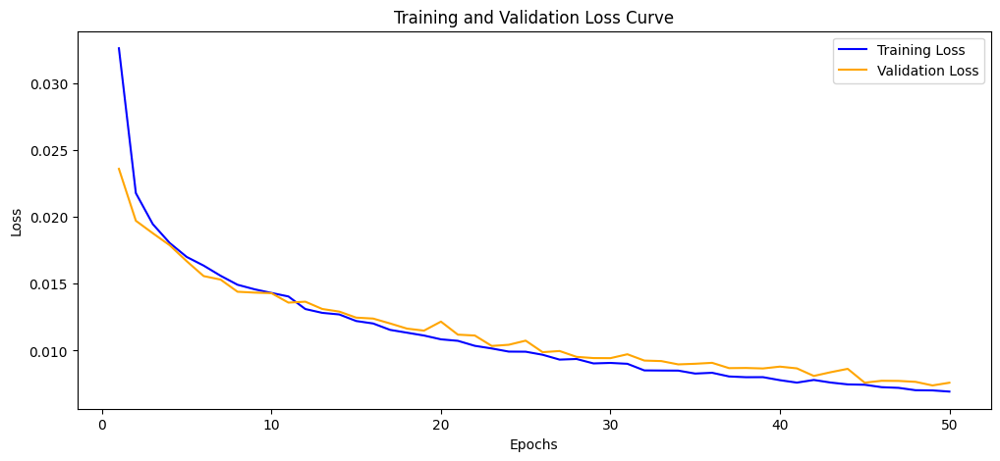

Model saved to ./model_paths/resnet34_lr0.0001_epoch49_batch32_trial.pth, cleaning required
Trial 6 complete----------------------------------------------------------------------------------------------------------------
Trial 7 with parameters batch_size: 32, lr: 5e-05, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [1/10], Training Loss: 0.0388, Validation Loss: 0.0253


Progress on Epoch 2: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [2/10], Training Loss: 0.0235, Validation Loss: 0.0221


Progress on Epoch 3: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [3/10], Training Loss: 0.0211, Validation Loss: 0.0197


Progress on Epoch 4: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [4/10], Training Loss: 0.0195, Validation Loss: 0.0185


Progress on Epoch 5: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [5/10], Training Loss: 0.0185, Validation Loss: 0.0180


Progress on Epoch 6: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [6/10], Training Loss: 0.0176, Validation Loss: 0.0172


Progress on Epoch 7: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [7/10], Training Loss: 0.0168, Validation Loss: 0.0169


Progress on Epoch 8: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [8/10], Training Loss: 0.0165, Validation Loss: 0.0159


Progress on Epoch 9: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [9/10], Training Loss: 0.0160, Validation Loss: 0.0160


Progress on Epoch 10: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [10/10], Training Loss: 0.0154, Validation Loss: 0.0154
Training Complete!


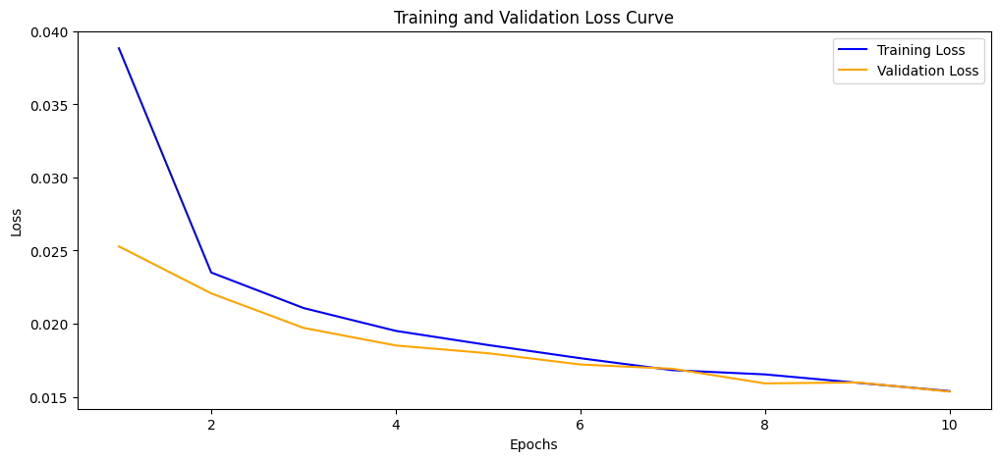

Model saved to ./model_paths/resnet34_lr5e-05_epoch9_batch32_trial.pth, cleaning required
Trial 7 complete----------------------------------------------------------------------------------------------------------------
Trial 8 with parameters batch_size: 32, lr: 5e-05, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [1/25], Training Loss: 0.0397, Validation Loss: 0.0250


Progress on Epoch 2: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [2/25], Training Loss: 0.0237, Validation Loss: 0.0219


Progress on Epoch 3: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [3/25], Training Loss: 0.0210, Validation Loss: 0.0196


Progress on Epoch 4: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [4/25], Training Loss: 0.0197, Validation Loss: 0.0188


Progress on Epoch 5: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [5/25], Training Loss: 0.0186, Validation Loss: 0.0181


Progress on Epoch 6: 100%|██████████| 475/475 [04:21<00:00,  1.81it/s]


Epoch [6/25], Training Loss: 0.0179, Validation Loss: 0.0172


Progress on Epoch 7: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [7/25], Training Loss: 0.0173, Validation Loss: 0.0166


Progress on Epoch 8: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [8/25], Training Loss: 0.0166, Validation Loss: 0.0168


Progress on Epoch 9: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [9/25], Training Loss: 0.0160, Validation Loss: 0.0159


Progress on Epoch 10: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [10/25], Training Loss: 0.0158, Validation Loss: 0.0157


Progress on Epoch 11: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [11/25], Training Loss: 0.0152, Validation Loss: 0.0154


Progress on Epoch 12: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [12/25], Training Loss: 0.0151, Validation Loss: 0.0150


Progress on Epoch 13: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [13/25], Training Loss: 0.0147, Validation Loss: 0.0147


Progress on Epoch 14: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [14/25], Training Loss: 0.0143, Validation Loss: 0.0145


Progress on Epoch 15: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [15/25], Training Loss: 0.0141, Validation Loss: 0.0144


Progress on Epoch 16: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [16/25], Training Loss: 0.0137, Validation Loss: 0.0142


Progress on Epoch 17: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [17/25], Training Loss: 0.0137, Validation Loss: 0.0139


Progress on Epoch 18: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [18/25], Training Loss: 0.0132, Validation Loss: 0.0134


Progress on Epoch 19: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [19/25], Training Loss: 0.0129, Validation Loss: 0.0133


Progress on Epoch 20: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [20/25], Training Loss: 0.0126, Validation Loss: 0.0130


Progress on Epoch 21: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [21/25], Training Loss: 0.0124, Validation Loss: 0.0127


Progress on Epoch 22: 100%|██████████| 475/475 [04:20<00:00,  1.83it/s]


Epoch [22/25], Training Loss: 0.0123, Validation Loss: 0.0130


Progress on Epoch 23: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [23/25], Training Loss: 0.0119, Validation Loss: 0.0124


Progress on Epoch 24: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [24/25], Training Loss: 0.0118, Validation Loss: 0.0127


Progress on Epoch 25: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [25/25], Training Loss: 0.0116, Validation Loss: 0.0123
Training Complete!


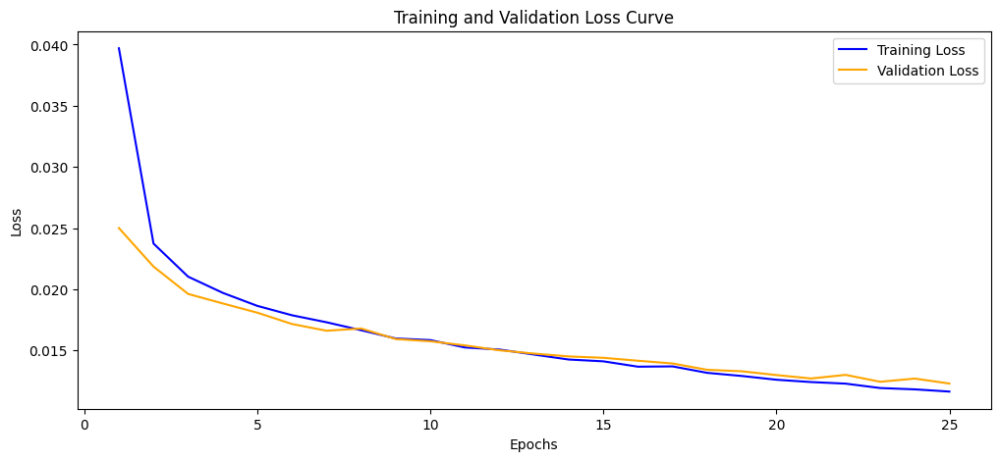

Model saved to ./model_paths/resnet34_lr5e-05_epoch24_batch32_trial.pth, cleaning required
Trial 8 complete----------------------------------------------------------------------------------------------------------------
Trial 9 with parameters batch_size: 32, lr: 5e-05, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [1/50], Training Loss: 0.0386, Validation Loss: 0.0246


Progress on Epoch 2: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [2/50], Training Loss: 0.0238, Validation Loss: 0.0223


Progress on Epoch 3: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [3/50], Training Loss: 0.0216, Validation Loss: 0.0211


Progress on Epoch 4: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [4/50], Training Loss: 0.0198, Validation Loss: 0.0191


Progress on Epoch 5: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [5/50], Training Loss: 0.0187, Validation Loss: 0.0185


Progress on Epoch 6: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [6/50], Training Loss: 0.0181, Validation Loss: 0.0178


Progress on Epoch 7: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [7/50], Training Loss: 0.0173, Validation Loss: 0.0173


Progress on Epoch 8: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [8/50], Training Loss: 0.0165, Validation Loss: 0.0162


Progress on Epoch 9: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [9/50], Training Loss: 0.0162, Validation Loss: 0.0162


Progress on Epoch 10: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [10/50], Training Loss: 0.0156, Validation Loss: 0.0155


Progress on Epoch 11: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [11/50], Training Loss: 0.0151, Validation Loss: 0.0149


Progress on Epoch 12: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [12/50], Training Loss: 0.0148, Validation Loss: 0.0152


Progress on Epoch 13: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [13/50], Training Loss: 0.0145, Validation Loss: 0.0148


Progress on Epoch 14: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [14/50], Training Loss: 0.0142, Validation Loss: 0.0146


Progress on Epoch 15: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [15/50], Training Loss: 0.0139, Validation Loss: 0.0142


Progress on Epoch 16: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [16/50], Training Loss: 0.0136, Validation Loss: 0.0137


Progress on Epoch 17: 100%|██████████| 475/475 [04:21<00:00,  1.81it/s]


Epoch [17/50], Training Loss: 0.0133, Validation Loss: 0.0139


Progress on Epoch 18: 100%|██████████| 475/475 [04:19<00:00,  1.83it/s]


Epoch [18/50], Training Loss: 0.0132, Validation Loss: 0.0133


Progress on Epoch 19: 100%|██████████| 475/475 [04:24<00:00,  1.80it/s]


Epoch [19/50], Training Loss: 0.0128, Validation Loss: 0.0130


Progress on Epoch 20: 100%|██████████| 475/475 [04:33<00:00,  1.74it/s]


Epoch [20/50], Training Loss: 0.0126, Validation Loss: 0.0127


Progress on Epoch 21: 100%|██████████| 475/475 [04:32<00:00,  1.74it/s]


Epoch [21/50], Training Loss: 0.0123, Validation Loss: 0.0131


Progress on Epoch 22: 100%|██████████| 475/475 [04:31<00:00,  1.75it/s]


Epoch [22/50], Training Loss: 0.0122, Validation Loss: 0.0124


Progress on Epoch 23: 100%|██████████| 475/475 [04:30<00:00,  1.75it/s]


Epoch [23/50], Training Loss: 0.0119, Validation Loss: 0.0127


Progress on Epoch 24: 100%|██████████| 475/475 [04:24<00:00,  1.79it/s]


Epoch [24/50], Training Loss: 0.0117, Validation Loss: 0.0123


Progress on Epoch 25: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [25/50], Training Loss: 0.0114, Validation Loss: 0.0120


Progress on Epoch 26: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [26/50], Training Loss: 0.0115, Validation Loss: 0.0120


Progress on Epoch 27: 100%|██████████| 475/475 [04:26<00:00,  1.78it/s]


Epoch [27/50], Training Loss: 0.0113, Validation Loss: 0.0119


Progress on Epoch 28: 100%|██████████| 475/475 [04:32<00:00,  1.74it/s]


Epoch [28/50], Training Loss: 0.0111, Validation Loss: 0.0117


Progress on Epoch 29: 100%|██████████| 475/475 [04:33<00:00,  1.74it/s]


Epoch [29/50], Training Loss: 0.0107, Validation Loss: 0.0113


Progress on Epoch 30: 100%|██████████| 475/475 [04:30<00:00,  1.75it/s]


Epoch [30/50], Training Loss: 0.0108, Validation Loss: 0.0114


Progress on Epoch 31: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [31/50], Training Loss: 0.0106, Validation Loss: 0.0115


Progress on Epoch 32: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [32/50], Training Loss: 0.0105, Validation Loss: 0.0110


Progress on Epoch 33: 100%|██████████| 475/475 [04:24<00:00,  1.80it/s]


Epoch [33/50], Training Loss: 0.0103, Validation Loss: 0.0110


Progress on Epoch 34: 100%|██████████| 475/475 [04:24<00:00,  1.79it/s]


Epoch [34/50], Training Loss: 0.0101, Validation Loss: 0.0107


Progress on Epoch 35: 100%|██████████| 475/475 [04:25<00:00,  1.79it/s]


Epoch [35/50], Training Loss: 0.0099, Validation Loss: 0.0105


Progress on Epoch 36: 100%|██████████| 475/475 [04:24<00:00,  1.79it/s]


Epoch [36/50], Training Loss: 0.0098, Validation Loss: 0.0104


Progress on Epoch 37: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [37/50], Training Loss: 0.0096, Validation Loss: 0.0102


Progress on Epoch 38: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [38/50], Training Loss: 0.0096, Validation Loss: 0.0109


Progress on Epoch 39: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [39/50], Training Loss: 0.0095, Validation Loss: 0.0099


Progress on Epoch 40: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [40/50], Training Loss: 0.0093, Validation Loss: 0.0099


Progress on Epoch 41: 100%|██████████| 475/475 [04:22<00:00,  1.81it/s]


Epoch [41/50], Training Loss: 0.0094, Validation Loss: 0.0098


Progress on Epoch 42: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [42/50], Training Loss: 0.0092, Validation Loss: 0.0101


Progress on Epoch 43: 100%|██████████| 475/475 [04:23<00:00,  1.81it/s]


Epoch [43/50], Training Loss: 0.0090, Validation Loss: 0.0095


Progress on Epoch 44: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [44/50], Training Loss: 0.0090, Validation Loss: 0.0095


Progress on Epoch 45: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [45/50], Training Loss: 0.0089, Validation Loss: 0.0097


Progress on Epoch 46: 100%|██████████| 475/475 [04:20<00:00,  1.82it/s]


Epoch [46/50], Training Loss: 0.0087, Validation Loss: 0.0096


Progress on Epoch 47: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [47/50], Training Loss: 0.0088, Validation Loss: 0.0097


Progress on Epoch 48: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [48/50], Training Loss: 0.0086, Validation Loss: 0.0093


Progress on Epoch 49: 100%|██████████| 475/475 [04:23<00:00,  1.80it/s]


Epoch [49/50], Training Loss: 0.0085, Validation Loss: 0.0091


Progress on Epoch 50: 100%|██████████| 475/475 [04:21<00:00,  1.82it/s]


Epoch [50/50], Training Loss: 0.0083, Validation Loss: 0.0092
Training Complete!


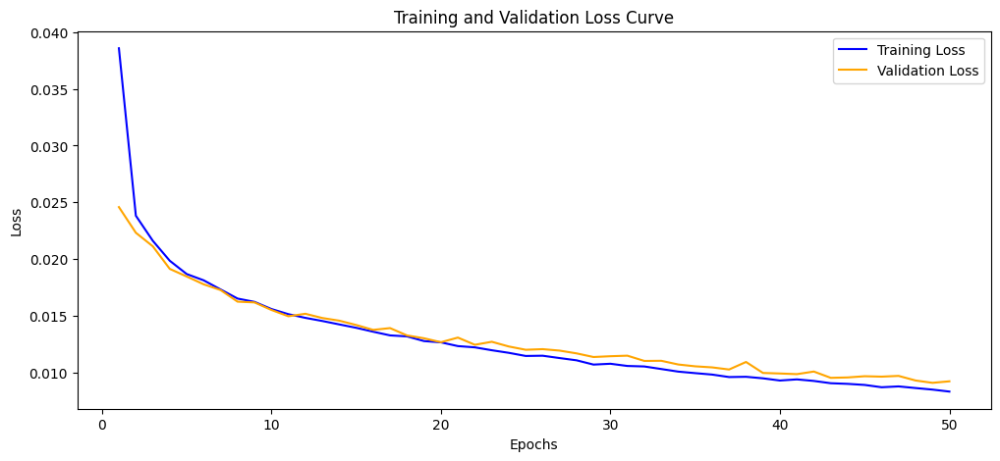

Model saved to ./model_paths/resnet34_lr5e-05_epoch49_batch32_trial.pth, cleaning required
Trial 9 complete----------------------------------------------------------------------------------------------------------------
Trial 10 with parameters batch_size: 64, lr: 0.0005, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [1/10], Training Loss: 0.0307, Validation Loss: 0.0213


Progress on Epoch 2: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [2/10], Training Loss: 0.0206, Validation Loss: 0.0188


Progress on Epoch 3: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [3/10], Training Loss: 0.0179, Validation Loss: 0.0191


Progress on Epoch 4: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [4/10], Training Loss: 0.0168, Validation Loss: 0.0180


Progress on Epoch 5: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [5/10], Training Loss: 0.0159, Validation Loss: 0.0151


Progress on Epoch 6: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [6/10], Training Loss: 0.0147, Validation Loss: 0.0148


Progress on Epoch 7: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [7/10], Training Loss: 0.0142, Validation Loss: 0.0145


Progress on Epoch 8: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [8/10], Training Loss: 0.0138, Validation Loss: 0.0196


Progress on Epoch 9: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [9/10], Training Loss: 0.0137, Validation Loss: 0.0144


Progress on Epoch 10: 100%|██████████| 238/238 [03:19<00:00,  1.20it/s]


Epoch [10/10], Training Loss: 0.0132, Validation Loss: 0.0129
Training Complete!


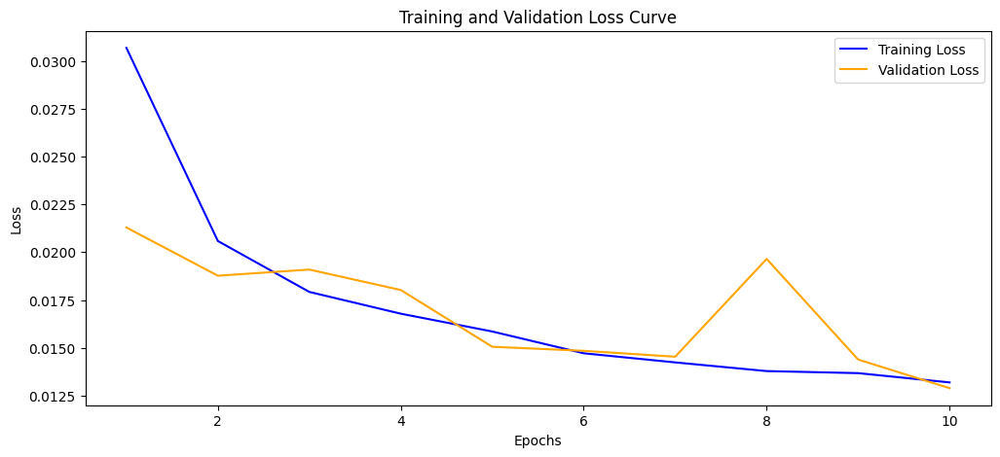

Model saved to ./model_paths/resnet34_lr0.0005_epoch9_batch64_trial.pth, cleaning required
Trial 10 complete----------------------------------------------------------------------------------------------------------------
Trial 11 with parameters batch_size: 64, lr: 0.0005, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [1/25], Training Loss: 0.0313, Validation Loss: 0.0218


Progress on Epoch 2: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [2/25], Training Loss: 0.0215, Validation Loss: 0.0222


Progress on Epoch 3: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [3/25], Training Loss: 0.0185, Validation Loss: 0.0185


Progress on Epoch 4: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [4/25], Training Loss: 0.0168, Validation Loss: 0.0162


Progress on Epoch 5: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [5/25], Training Loss: 0.0159, Validation Loss: 0.0166


Progress on Epoch 6: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [6/25], Training Loss: 0.0150, Validation Loss: 0.0157


Progress on Epoch 7: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [7/25], Training Loss: 0.0145, Validation Loss: 0.0153


Progress on Epoch 8: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [8/25], Training Loss: 0.0139, Validation Loss: 0.0141


Progress on Epoch 9: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [9/25], Training Loss: 0.0133, Validation Loss: 0.0137


Progress on Epoch 10: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [10/25], Training Loss: 0.0128, Validation Loss: 0.0135


Progress on Epoch 11: 100%|██████████| 238/238 [03:19<00:00,  1.20it/s]


Epoch [11/25], Training Loss: 0.0124, Validation Loss: 0.0124


Progress on Epoch 12: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [12/25], Training Loss: 0.0119, Validation Loss: 0.0121


Progress on Epoch 13: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [13/25], Training Loss: 0.0116, Validation Loss: 0.0124


Progress on Epoch 14: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [14/25], Training Loss: 0.0112, Validation Loss: 0.0114


Progress on Epoch 15: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [15/25], Training Loss: 0.0109, Validation Loss: 0.0118


Progress on Epoch 16: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [16/25], Training Loss: 0.0107, Validation Loss: 0.0108


Progress on Epoch 17: 100%|██████████| 238/238 [03:19<00:00,  1.20it/s]


Epoch [17/25], Training Loss: 0.0105, Validation Loss: 0.0112


Progress on Epoch 18: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [18/25], Training Loss: 0.0099, Validation Loss: 0.0111


Progress on Epoch 19: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [19/25], Training Loss: 0.0099, Validation Loss: 0.0101


Progress on Epoch 20: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [20/25], Training Loss: 0.0095, Validation Loss: 0.0104


Progress on Epoch 21: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [21/25], Training Loss: 0.0094, Validation Loss: 0.0105


Progress on Epoch 22: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [22/25], Training Loss: 0.0091, Validation Loss: 0.0097


Progress on Epoch 23: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [23/25], Training Loss: 0.0091, Validation Loss: 0.0096


Progress on Epoch 24: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [24/25], Training Loss: 0.0088, Validation Loss: 0.0100


Progress on Epoch 25: 100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


Epoch [25/25], Training Loss: 0.0086, Validation Loss: 0.0090
Training Complete!


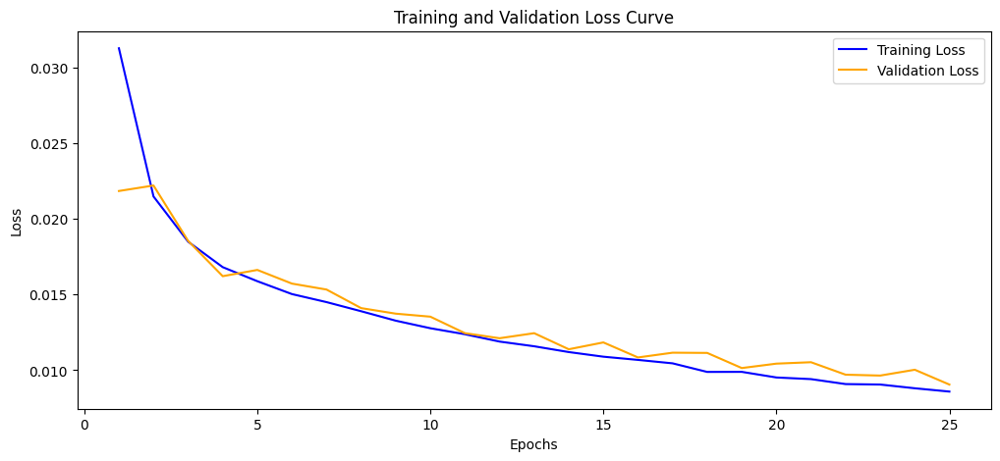

Model saved to ./model_paths/resnet34_lr0.0005_epoch24_batch64_trial.pth, cleaning required
Trial 11 complete----------------------------------------------------------------------------------------------------------------
Trial 12 with parameters batch_size: 64, lr: 0.0005, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [1/50], Training Loss: 0.0301, Validation Loss: 0.0226


Progress on Epoch 2: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [2/50], Training Loss: 0.0208, Validation Loss: 0.0195


Progress on Epoch 3: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [3/50], Training Loss: 0.0182, Validation Loss: 0.0168


Progress on Epoch 4: 100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


Epoch [4/50], Training Loss: 0.0168, Validation Loss: 0.0163


Progress on Epoch 5: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [5/50], Training Loss: 0.0155, Validation Loss: 0.0149


Progress on Epoch 6: 100%|██████████| 238/238 [03:25<00:00,  1.16it/s]


Epoch [6/50], Training Loss: 0.0148, Validation Loss: 0.0156


Progress on Epoch 7: 100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


Epoch [7/50], Training Loss: 0.0143, Validation Loss: 0.0143


Progress on Epoch 8: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [8/50], Training Loss: 0.0137, Validation Loss: 0.0138


Progress on Epoch 9: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [9/50], Training Loss: 0.0132, Validation Loss: 0.0204


Progress on Epoch 10: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [10/50], Training Loss: 0.0131, Validation Loss: 0.0129


Progress on Epoch 11: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [11/50], Training Loss: 0.0127, Validation Loss: 0.0130


Progress on Epoch 12: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [12/50], Training Loss: 0.0120, Validation Loss: 0.0119


Progress on Epoch 13: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [13/50], Training Loss: 0.0116, Validation Loss: 0.0120


Progress on Epoch 14: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [14/50], Training Loss: 0.0113, Validation Loss: 0.0118


Progress on Epoch 15: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [15/50], Training Loss: 0.0109, Validation Loss: 0.0115


Progress on Epoch 16: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [16/50], Training Loss: 0.0106, Validation Loss: 0.0112


Progress on Epoch 17: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [17/50], Training Loss: 0.0105, Validation Loss: 0.0105


Progress on Epoch 18: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [18/50], Training Loss: 0.0100, Validation Loss: 0.0110


Progress on Epoch 19: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [19/50], Training Loss: 0.0098, Validation Loss: 0.0104


Progress on Epoch 20: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [20/50], Training Loss: 0.0096, Validation Loss: 0.0102


Progress on Epoch 21: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [21/50], Training Loss: 0.0094, Validation Loss: 0.0099


Progress on Epoch 22: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [22/50], Training Loss: 0.0092, Validation Loss: 0.0101


Progress on Epoch 23: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [23/50], Training Loss: 0.0088, Validation Loss: 0.0095


Progress on Epoch 24: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [24/50], Training Loss: 0.0087, Validation Loss: 0.0089


Progress on Epoch 25: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [25/50], Training Loss: 0.0086, Validation Loss: 0.0093


Progress on Epoch 26: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [26/50], Training Loss: 0.0084, Validation Loss: 0.0091


Progress on Epoch 27: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [27/50], Training Loss: 0.0085, Validation Loss: 0.0091


Progress on Epoch 28: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [28/50], Training Loss: 0.0081, Validation Loss: 0.0089


Progress on Epoch 29: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [29/50], Training Loss: 0.0080, Validation Loss: 0.0084


Progress on Epoch 30: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [30/50], Training Loss: 0.0080, Validation Loss: 0.0086


Progress on Epoch 31: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [31/50], Training Loss: 0.0078, Validation Loss: 0.0091


Progress on Epoch 32: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [32/50], Training Loss: 0.0077, Validation Loss: 0.0088


Progress on Epoch 33: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [33/50], Training Loss: 0.0078, Validation Loss: 0.0081


Progress on Epoch 34: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [34/50], Training Loss: 0.0076, Validation Loss: 0.0086


Progress on Epoch 35: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [35/50], Training Loss: 0.0075, Validation Loss: 0.0080


Progress on Epoch 36: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [36/50], Training Loss: 0.0073, Validation Loss: 0.0081


Progress on Epoch 37: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [37/50], Training Loss: 0.0073, Validation Loss: 0.0078


Progress on Epoch 38: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [38/50], Training Loss: 0.0073, Validation Loss: 0.0079


Progress on Epoch 39: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [39/50], Training Loss: 0.0070, Validation Loss: 0.0081


Progress on Epoch 40: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [40/50], Training Loss: 0.0069, Validation Loss: 0.0077


Progress on Epoch 41: 100%|██████████| 238/238 [03:14<00:00,  1.23it/s]


Epoch [41/50], Training Loss: 0.0069, Validation Loss: 0.0077


Progress on Epoch 42: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [42/50], Training Loss: 0.0068, Validation Loss: 0.0076


Progress on Epoch 43: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [43/50], Training Loss: 0.0068, Validation Loss: 0.0074


Progress on Epoch 44: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [44/50], Training Loss: 0.0067, Validation Loss: 0.0073


Progress on Epoch 45: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [45/50], Training Loss: 0.0067, Validation Loss: 0.0076


Progress on Epoch 46: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [46/50], Training Loss: 0.0066, Validation Loss: 0.0071


Progress on Epoch 47: 100%|██████████| 238/238 [03:19<00:00,  1.20it/s]


Epoch [47/50], Training Loss: 0.0063, Validation Loss: 0.0073


Progress on Epoch 48: 100%|██████████| 238/238 [03:24<00:00,  1.17it/s]


Epoch [48/50], Training Loss: 0.0064, Validation Loss: 0.0073


Progress on Epoch 49: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [49/50], Training Loss: 0.0065, Validation Loss: 0.0073


Progress on Epoch 50: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [50/50], Training Loss: 0.0063, Validation Loss: 0.0071
Training Complete!


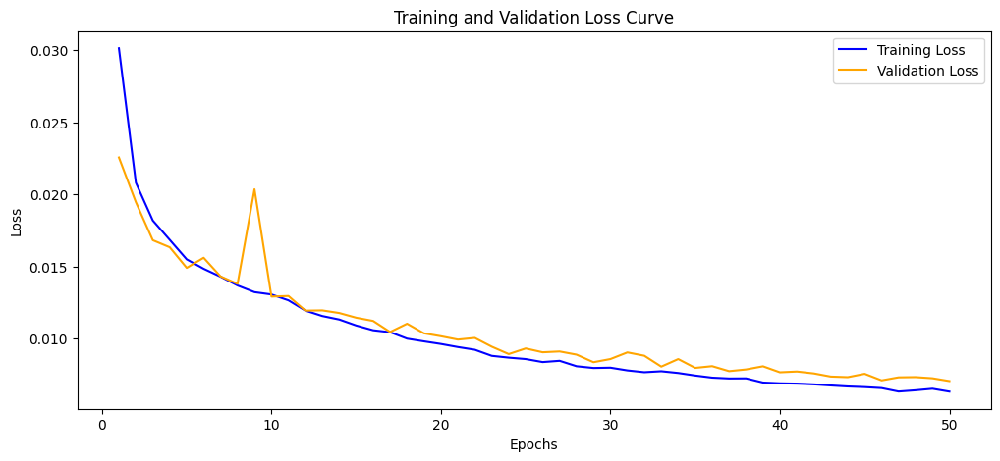

Model saved to ./model_paths/resnet34_lr0.0005_epoch49_batch64_trial.pth, cleaning required
Trial 12 complete----------------------------------------------------------------------------------------------------------------
Trial 13 with parameters batch_size: 64, lr: 0.0001, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [1/10], Training Loss: 0.0381, Validation Loss: 0.0245


Progress on Epoch 2: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [2/10], Training Loss: 0.0231, Validation Loss: 0.0224


Progress on Epoch 3: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [3/10], Training Loss: 0.0206, Validation Loss: 0.0195


Progress on Epoch 4: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [4/10], Training Loss: 0.0186, Validation Loss: 0.0183


Progress on Epoch 5: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [5/10], Training Loss: 0.0178, Validation Loss: 0.0174


Progress on Epoch 6: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [6/10], Training Loss: 0.0169, Validation Loss: 0.0165


Progress on Epoch 7: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [7/10], Training Loss: 0.0161, Validation Loss: 0.0158


Progress on Epoch 8: 100%|██████████| 238/238 [03:14<00:00,  1.23it/s]


Epoch [8/10], Training Loss: 0.0154, Validation Loss: 0.0155


Progress on Epoch 9: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [9/10], Training Loss: 0.0149, Validation Loss: 0.0154


Progress on Epoch 10: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [10/10], Training Loss: 0.0146, Validation Loss: 0.0152
Training Complete!


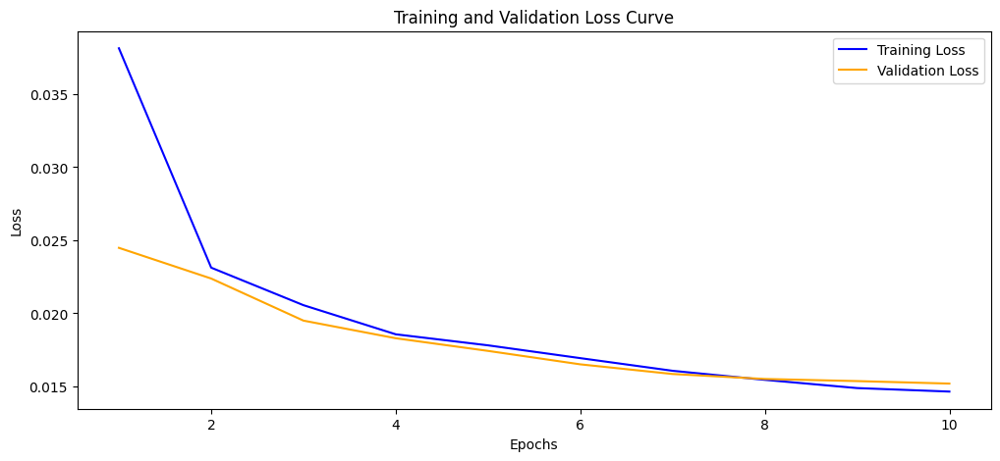

Model saved to ./model_paths/resnet34_lr0.0001_epoch9_batch64_trial.pth, cleaning required
Trial 13 complete----------------------------------------------------------------------------------------------------------------
Trial 14 with parameters batch_size: 64, lr: 0.0001, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [1/25], Training Loss: 0.0394, Validation Loss: 0.0251


Progress on Epoch 2: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [2/25], Training Loss: 0.0233, Validation Loss: 0.0214


Progress on Epoch 3: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [3/25], Training Loss: 0.0208, Validation Loss: 0.0201


Progress on Epoch 4: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [4/25], Training Loss: 0.0190, Validation Loss: 0.0180


Progress on Epoch 5: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [5/25], Training Loss: 0.0175, Validation Loss: 0.0170


Progress on Epoch 6: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [6/25], Training Loss: 0.0168, Validation Loss: 0.0167


Progress on Epoch 7: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [7/25], Training Loss: 0.0162, Validation Loss: 0.0160


Progress on Epoch 8: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [8/25], Training Loss: 0.0157, Validation Loss: 0.0154


Progress on Epoch 9: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [9/25], Training Loss: 0.0151, Validation Loss: 0.0152


Progress on Epoch 10: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [10/25], Training Loss: 0.0146, Validation Loss: 0.0150


Progress on Epoch 11: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [11/25], Training Loss: 0.0141, Validation Loss: 0.0143


Progress on Epoch 12: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [12/25], Training Loss: 0.0138, Validation Loss: 0.0138


Progress on Epoch 13: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [13/25], Training Loss: 0.0135, Validation Loss: 0.0136


Progress on Epoch 14: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [14/25], Training Loss: 0.0131, Validation Loss: 0.0140


Progress on Epoch 15: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [15/25], Training Loss: 0.0129, Validation Loss: 0.0132


Progress on Epoch 16: 100%|██████████| 238/238 [03:15<00:00,  1.22it/s]


Epoch [16/25], Training Loss: 0.0124, Validation Loss: 0.0133


Progress on Epoch 17: 100%|██████████| 238/238 [03:14<00:00,  1.23it/s]


Epoch [17/25], Training Loss: 0.0121, Validation Loss: 0.0125


Progress on Epoch 18: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [18/25], Training Loss: 0.0120, Validation Loss: 0.0121


Progress on Epoch 19: 100%|██████████| 238/238 [03:14<00:00,  1.22it/s]


Epoch [19/25], Training Loss: 0.0116, Validation Loss: 0.0132


Progress on Epoch 20: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [20/25], Training Loss: 0.0119, Validation Loss: 0.0124


Progress on Epoch 21: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [21/25], Training Loss: 0.0114, Validation Loss: 0.0123


Progress on Epoch 22: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [22/25], Training Loss: 0.0111, Validation Loss: 0.0120


Progress on Epoch 23: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [23/25], Training Loss: 0.0109, Validation Loss: 0.0115


Progress on Epoch 24: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [24/25], Training Loss: 0.0107, Validation Loss: 0.0111


Progress on Epoch 25: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [25/25], Training Loss: 0.0104, Validation Loss: 0.0110
Training Complete!


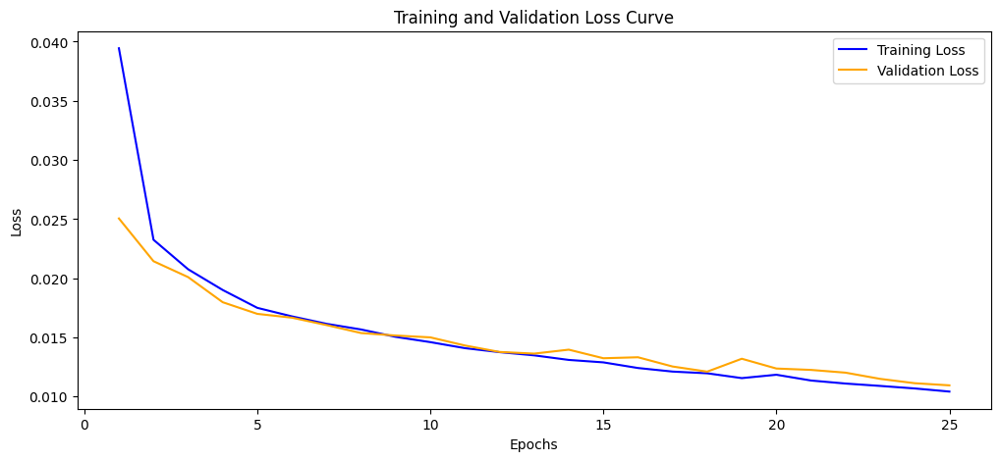

Model saved to ./model_paths/resnet34_lr0.0001_epoch24_batch64_trial.pth, cleaning required
Trial 14 complete----------------------------------------------------------------------------------------------------------------
Trial 15 with parameters batch_size: 64, lr: 0.0001, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [1/50], Training Loss: 0.0400, Validation Loss: 0.0257


Progress on Epoch 2: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [2/50], Training Loss: 0.0232, Validation Loss: 0.0214


Progress on Epoch 3: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [3/50], Training Loss: 0.0202, Validation Loss: 0.0201


Progress on Epoch 4: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [4/50], Training Loss: 0.0183, Validation Loss: 0.0178


Progress on Epoch 5: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [5/50], Training Loss: 0.0175, Validation Loss: 0.0168


Progress on Epoch 6: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [6/50], Training Loss: 0.0166, Validation Loss: 0.0163


Progress on Epoch 7: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [7/50], Training Loss: 0.0159, Validation Loss: 0.0161


Progress on Epoch 8: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [8/50], Training Loss: 0.0153, Validation Loss: 0.0156


Progress on Epoch 9: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [9/50], Training Loss: 0.0149, Validation Loss: 0.0150


Progress on Epoch 10: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [10/50], Training Loss: 0.0145, Validation Loss: 0.0149


Progress on Epoch 11: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [11/50], Training Loss: 0.0140, Validation Loss: 0.0146


Progress on Epoch 12: 100%|██████████| 238/238 [03:19<00:00,  1.20it/s]


Epoch [12/50], Training Loss: 0.0138, Validation Loss: 0.0138


Progress on Epoch 13: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [13/50], Training Loss: 0.0134, Validation Loss: 0.0142


Progress on Epoch 14: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [14/50], Training Loss: 0.0130, Validation Loss: 0.0139


Progress on Epoch 15: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [15/50], Training Loss: 0.0129, Validation Loss: 0.0141


Progress on Epoch 16: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [16/50], Training Loss: 0.0124, Validation Loss: 0.0136


Progress on Epoch 17: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [17/50], Training Loss: 0.0122, Validation Loss: 0.0127


Progress on Epoch 18: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [18/50], Training Loss: 0.0121, Validation Loss: 0.0127


Progress on Epoch 19: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [19/50], Training Loss: 0.0116, Validation Loss: 0.0124


Progress on Epoch 20: 100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


Epoch [20/50], Training Loss: 0.0114, Validation Loss: 0.0120


Progress on Epoch 21: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [21/50], Training Loss: 0.0112, Validation Loss: 0.0117


Progress on Epoch 22: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [22/50], Training Loss: 0.0109, Validation Loss: 0.0121


Progress on Epoch 23: 100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


Epoch [23/50], Training Loss: 0.0110, Validation Loss: 0.0111


Progress on Epoch 24: 100%|██████████| 238/238 [03:15<00:00,  1.21it/s]


Epoch [24/50], Training Loss: 0.0107, Validation Loss: 0.0116


Progress on Epoch 25: 100%|██████████| 238/238 [03:16<00:00,  1.21it/s]


Epoch [25/50], Training Loss: 0.0106, Validation Loss: 0.0115


Progress on Epoch 26: 100%|██████████| 238/238 [03:17<00:00,  1.21it/s]


Epoch [26/50], Training Loss: 0.0103, Validation Loss: 0.0109


Progress on Epoch 27: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [27/50], Training Loss: 0.0102, Validation Loss: 0.0119


Progress on Epoch 28: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [28/50], Training Loss: 0.0101, Validation Loss: 0.0107


Progress on Epoch 29: 100%|██████████| 238/238 [03:26<00:00,  1.15it/s]


Epoch [29/50], Training Loss: 0.0099, Validation Loss: 0.0104


Progress on Epoch 30: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [30/50], Training Loss: 0.0097, Validation Loss: 0.0102


Progress on Epoch 31: 100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


Epoch [31/50], Training Loss: 0.0096, Validation Loss: 0.0099


Progress on Epoch 32: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [32/50], Training Loss: 0.0094, Validation Loss: 0.0098


Progress on Epoch 33: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [33/50], Training Loss: 0.0092, Validation Loss: 0.0101


Progress on Epoch 34: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [34/50], Training Loss: 0.0091, Validation Loss: 0.0098


Progress on Epoch 35: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [35/50], Training Loss: 0.0089, Validation Loss: 0.0097


Progress on Epoch 36: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [36/50], Training Loss: 0.0088, Validation Loss: 0.0095


Progress on Epoch 37: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [37/50], Training Loss: 0.0086, Validation Loss: 0.0093


Progress on Epoch 38: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [38/50], Training Loss: 0.0087, Validation Loss: 0.0093


Progress on Epoch 39: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [39/50], Training Loss: 0.0085, Validation Loss: 0.0090


Progress on Epoch 40: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [40/50], Training Loss: 0.0085, Validation Loss: 0.0091


Progress on Epoch 41: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [41/50], Training Loss: 0.0085, Validation Loss: 0.0089


Progress on Epoch 42: 100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


Epoch [42/50], Training Loss: 0.0082, Validation Loss: 0.0090


Progress on Epoch 43: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [43/50], Training Loss: 0.0081, Validation Loss: 0.0087


Progress on Epoch 44: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [44/50], Training Loss: 0.0080, Validation Loss: 0.0091


Progress on Epoch 45: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [45/50], Training Loss: 0.0079, Validation Loss: 0.0088


Progress on Epoch 46: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [46/50], Training Loss: 0.0078, Validation Loss: 0.0085


Progress on Epoch 47: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [47/50], Training Loss: 0.0078, Validation Loss: 0.0084


Progress on Epoch 48: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [48/50], Training Loss: 0.0078, Validation Loss: 0.0083


Progress on Epoch 49: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [49/50], Training Loss: 0.0076, Validation Loss: 0.0087


Progress on Epoch 50: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [50/50], Training Loss: 0.0076, Validation Loss: 0.0086
Training Complete!


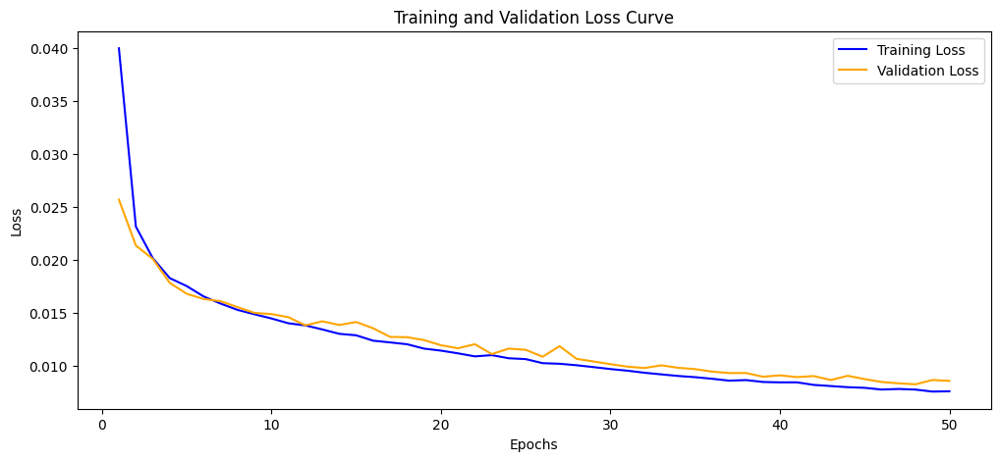

Model saved to ./model_paths/resnet34_lr0.0001_epoch49_batch64_trial.pth, cleaning required
Trial 15 complete----------------------------------------------------------------------------------------------------------------
Trial 16 with parameters batch_size: 64, lr: 5e-05, epochs: 10------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [1/10], Training Loss: 0.0448, Validation Loss: 0.0274


Progress on Epoch 2: 100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


Epoch [2/10], Training Loss: 0.0250, Validation Loss: 0.0234


Progress on Epoch 3: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [3/10], Training Loss: 0.0224, Validation Loss: 0.0212


Progress on Epoch 4: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [4/10], Training Loss: 0.0207, Validation Loss: 0.0200


Progress on Epoch 5: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [5/10], Training Loss: 0.0197, Validation Loss: 0.0189


Progress on Epoch 6: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [6/10], Training Loss: 0.0188, Validation Loss: 0.0184


Progress on Epoch 7: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [7/10], Training Loss: 0.0183, Validation Loss: 0.0175


Progress on Epoch 8: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [8/10], Training Loss: 0.0174, Validation Loss: 0.0174


Progress on Epoch 9: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [9/10], Training Loss: 0.0170, Validation Loss: 0.0171


Progress on Epoch 10: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [10/10], Training Loss: 0.0166, Validation Loss: 0.0164
Training Complete!


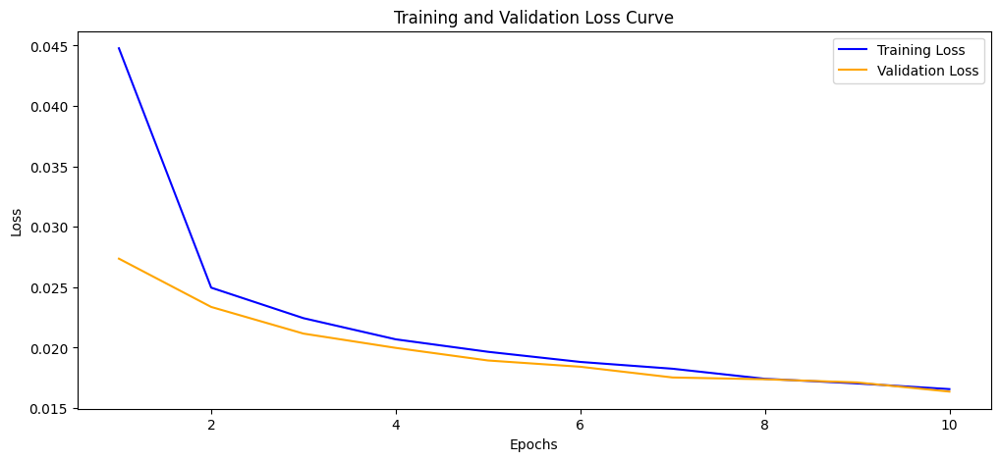

Model saved to ./model_paths/resnet34_lr5e-05_epoch9_batch64_trial.pth, cleaning required
Trial 16 complete----------------------------------------------------------------------------------------------------------------
Trial 17 with parameters batch_size: 64, lr: 5e-05, epochs: 25------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [1/25], Training Loss: 0.0496, Validation Loss: 0.0307


Progress on Epoch 2: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [2/25], Training Loss: 0.0257, Validation Loss: 0.0239


Progress on Epoch 3: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [3/25], Training Loss: 0.0226, Validation Loss: 0.0211


Progress on Epoch 4: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [4/25], Training Loss: 0.0206, Validation Loss: 0.0200


Progress on Epoch 5: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [5/25], Training Loss: 0.0192, Validation Loss: 0.0185


Progress on Epoch 6: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [6/25], Training Loss: 0.0185, Validation Loss: 0.0183


Progress on Epoch 7: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [7/25], Training Loss: 0.0179, Validation Loss: 0.0176


Progress on Epoch 8: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [8/25], Training Loss: 0.0171, Validation Loss: 0.0174


Progress on Epoch 9: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [9/25], Training Loss: 0.0170, Validation Loss: 0.0176


Progress on Epoch 10: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [10/25], Training Loss: 0.0165, Validation Loss: 0.0167


Progress on Epoch 11: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [11/25], Training Loss: 0.0159, Validation Loss: 0.0159


Progress on Epoch 12: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [12/25], Training Loss: 0.0156, Validation Loss: 0.0158


Progress on Epoch 13: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [13/25], Training Loss: 0.0152, Validation Loss: 0.0155


Progress on Epoch 14: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [14/25], Training Loss: 0.0150, Validation Loss: 0.0158


Progress on Epoch 15: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [15/25], Training Loss: 0.0147, Validation Loss: 0.0159


Progress on Epoch 16: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [16/25], Training Loss: 0.0148, Validation Loss: 0.0149


Progress on Epoch 17: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [17/25], Training Loss: 0.0144, Validation Loss: 0.0146


Progress on Epoch 18: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [18/25], Training Loss: 0.0141, Validation Loss: 0.0146


Progress on Epoch 19: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [19/25], Training Loss: 0.0139, Validation Loss: 0.0142


Progress on Epoch 20: 100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


Epoch [20/25], Training Loss: 0.0135, Validation Loss: 0.0142


Progress on Epoch 21: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [21/25], Training Loss: 0.0134, Validation Loss: 0.0143


Progress on Epoch 22: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [22/25], Training Loss: 0.0133, Validation Loss: 0.0140


Progress on Epoch 23: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [23/25], Training Loss: 0.0131, Validation Loss: 0.0134


Progress on Epoch 24: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [24/25], Training Loss: 0.0128, Validation Loss: 0.0136


Progress on Epoch 25: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [25/25], Training Loss: 0.0126, Validation Loss: 0.0134
Training Complete!


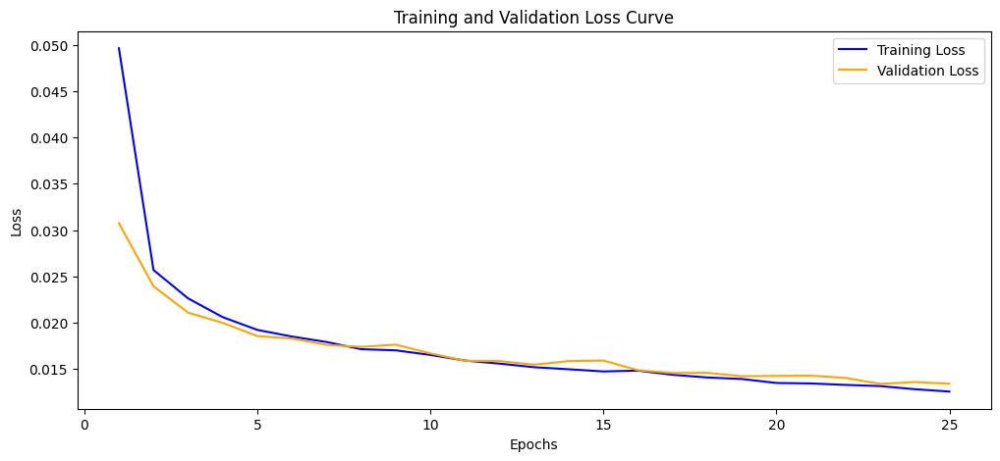

Model saved to ./model_paths/resnet34_lr5e-05_epoch24_batch64_trial.pth, cleaning required
Trial 17 complete----------------------------------------------------------------------------------------------------------------
Trial 18 with parameters batch_size: 64, lr: 5e-05, epochs: 50------------------------------------------------------


Progress on Epoch 1: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [1/50], Training Loss: 0.0484, Validation Loss: 0.0292


Progress on Epoch 2: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [2/50], Training Loss: 0.0255, Validation Loss: 0.0243


Progress on Epoch 3: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [3/50], Training Loss: 0.0225, Validation Loss: 0.0214


Progress on Epoch 4: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [4/50], Training Loss: 0.0208, Validation Loss: 0.0203


Progress on Epoch 5: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [5/50], Training Loss: 0.0197, Validation Loss: 0.0189


Progress on Epoch 6: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [6/50], Training Loss: 0.0189, Validation Loss: 0.0183


Progress on Epoch 7: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [7/50], Training Loss: 0.0180, Validation Loss: 0.0179


Progress on Epoch 8: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [8/50], Training Loss: 0.0176, Validation Loss: 0.0174


Progress on Epoch 9: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [9/50], Training Loss: 0.0169, Validation Loss: 0.0172


Progress on Epoch 10: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [10/50], Training Loss: 0.0166, Validation Loss: 0.0170


Progress on Epoch 11: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [11/50], Training Loss: 0.0162, Validation Loss: 0.0164


Progress on Epoch 12: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [12/50], Training Loss: 0.0161, Validation Loss: 0.0158


Progress on Epoch 13: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [13/50], Training Loss: 0.0156, Validation Loss: 0.0155


Progress on Epoch 14: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [14/50], Training Loss: 0.0154, Validation Loss: 0.0158


Progress on Epoch 15: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [15/50], Training Loss: 0.0149, Validation Loss: 0.0158


Progress on Epoch 16: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [16/50], Training Loss: 0.0147, Validation Loss: 0.0152


Progress on Epoch 17: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [17/50], Training Loss: 0.0145, Validation Loss: 0.0148


Progress on Epoch 18: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [18/50], Training Loss: 0.0142, Validation Loss: 0.0148


Progress on Epoch 19: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [19/50], Training Loss: 0.0139, Validation Loss: 0.0144


Progress on Epoch 20: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [20/50], Training Loss: 0.0137, Validation Loss: 0.0143


Progress on Epoch 21: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [21/50], Training Loss: 0.0135, Validation Loss: 0.0137


Progress on Epoch 22: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [22/50], Training Loss: 0.0133, Validation Loss: 0.0140


Progress on Epoch 23: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [23/50], Training Loss: 0.0131, Validation Loss: 0.0135


Progress on Epoch 24: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [24/50], Training Loss: 0.0128, Validation Loss: 0.0134


Progress on Epoch 25: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [25/50], Training Loss: 0.0128, Validation Loss: 0.0132


Progress on Epoch 26: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [26/50], Training Loss: 0.0126, Validation Loss: 0.0135


Progress on Epoch 27: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [27/50], Training Loss: 0.0125, Validation Loss: 0.0129


Progress on Epoch 28: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [28/50], Training Loss: 0.0122, Validation Loss: 0.0127


Progress on Epoch 29: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [29/50], Training Loss: 0.0123, Validation Loss: 0.0127


Progress on Epoch 30: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [30/50], Training Loss: 0.0119, Validation Loss: 0.0125


Progress on Epoch 31: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [31/50], Training Loss: 0.0119, Validation Loss: 0.0126


Progress on Epoch 32: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [32/50], Training Loss: 0.0116, Validation Loss: 0.0125


Progress on Epoch 33: 100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


Epoch [33/50], Training Loss: 0.0115, Validation Loss: 0.0128


Progress on Epoch 34: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [34/50], Training Loss: 0.0113, Validation Loss: 0.0120


Progress on Epoch 35: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [35/50], Training Loss: 0.0112, Validation Loss: 0.0123


Progress on Epoch 36: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [36/50], Training Loss: 0.0112, Validation Loss: 0.0117


Progress on Epoch 37: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [37/50], Training Loss: 0.0110, Validation Loss: 0.0115


Progress on Epoch 38: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [38/50], Training Loss: 0.0108, Validation Loss: 0.0116


Progress on Epoch 39: 100%|██████████| 238/238 [03:44<00:00,  1.06it/s]


Epoch [39/50], Training Loss: 0.0108, Validation Loss: 0.0122


Progress on Epoch 40: 100%|██████████| 238/238 [03:45<00:00,  1.06it/s]


Epoch [40/50], Training Loss: 0.0107, Validation Loss: 0.0115


Progress on Epoch 41: 100%|██████████| 238/238 [03:44<00:00,  1.06it/s]


Epoch [41/50], Training Loss: 0.0105, Validation Loss: 0.0112


Progress on Epoch 42: 100%|██████████| 238/238 [03:46<00:00,  1.05it/s]


Epoch [42/50], Training Loss: 0.0103, Validation Loss: 0.0110


Progress on Epoch 43: 100%|██████████| 238/238 [03:45<00:00,  1.05it/s]


Epoch [43/50], Training Loss: 0.0103, Validation Loss: 0.0108


Progress on Epoch 44: 100%|██████████| 238/238 [03:45<00:00,  1.06it/s]


Epoch [44/50], Training Loss: 0.0101, Validation Loss: 0.0109


Progress on Epoch 45: 100%|██████████| 238/238 [03:46<00:00,  1.05it/s]


Epoch [45/50], Training Loss: 0.0101, Validation Loss: 0.0110


Progress on Epoch 46: 100%|██████████| 238/238 [03:44<00:00,  1.06it/s]


Epoch [46/50], Training Loss: 0.0099, Validation Loss: 0.0106


Progress on Epoch 47: 100%|██████████| 238/238 [03:43<00:00,  1.06it/s]


Epoch [47/50], Training Loss: 0.0099, Validation Loss: 0.0107


Progress on Epoch 48: 100%|██████████| 238/238 [03:45<00:00,  1.06it/s]


Epoch [48/50], Training Loss: 0.0098, Validation Loss: 0.0102


Progress on Epoch 49: 100%|██████████| 238/238 [03:46<00:00,  1.05it/s]


Epoch [49/50], Training Loss: 0.0097, Validation Loss: 0.0104


Progress on Epoch 50: 100%|██████████| 238/238 [03:44<00:00,  1.06it/s]


Epoch [50/50], Training Loss: 0.0095, Validation Loss: 0.0105
Training Complete!


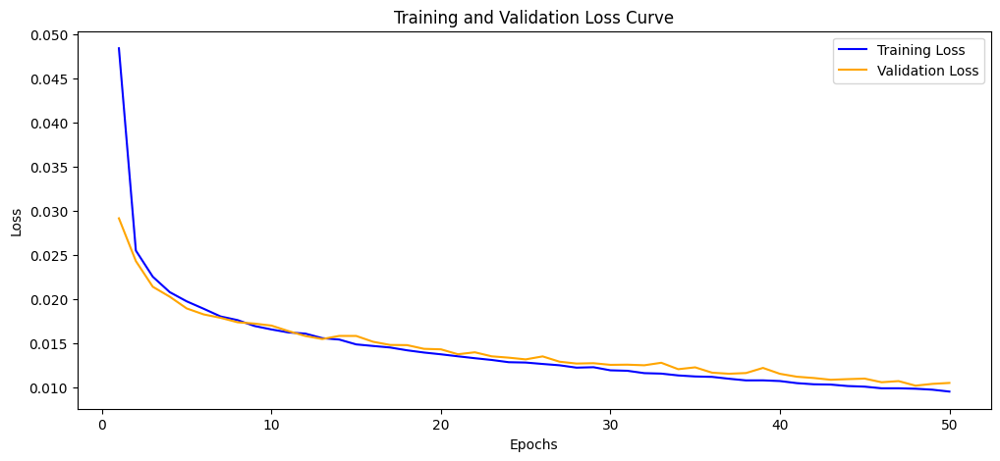

Model saved to ./model_paths/resnet34_lr5e-05_epoch49_batch64_trial.pth, cleaning required
Trial 18 complete----------------------------------------------------------------------------------------------------------------
Best model with parameters batch_size: 64, lr: 5e-05, epochs: 50


In [18]:
#Initial Tuning
batches = [32, 64]
lrs = [0.0005, 0.0001, 0.00005]
epochs = [10, 25, 50]
i = 0
best_train_loss = 100
best_validation_loss = 100
best_model = None
best_batch_size = 0
best_lr= 0
best_epoch = 0
best_trial = 0
model_list = []
for batch_size in batches:
    for lr in lrs:
        for epoch in epochs:
            i+=1
            print(f"Trial {i} with parameters batch_size: {batch_size}, lr: {lr}, epochs: {epoch}------------------------------------------------------")
            current_train_loss, current_validation_loss, current_model = train_RESNET_ENCODER(lr = lr, epochs = epoch, batch_size = batch_size)
            model_list.append(current_model)
            if((current_train_loss <= best_train_loss) and (current_validation_loss <= best_validation_loss)):
                best_model = current_model
                best_batch_size = batch_size
                best_lr= lr
                best_epoch = epoch 
                best_trial = i
            print(f"Trial {i} complete----------------------------------------------------------------------------------------------------------------")

print(f"Best model with parameters batch_size: {best_batch_size}, lr: {best_lr}, epochs: {best_epoch}")

In [20]:
# Define model checkpoint path
if os.path.exists(best_model):
    print(f"Model found at: {best_model}")
else:
    print(f" Model file NOT found in: {os.getcwd()}")
    print("Please check the file path or move the file to the correct location.")

Model found at: ./model_paths/resnet34_lr5e-05_epoch49_batch64_trial.pth


In [89]:
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, pin_memory=True)
all_masked_images = []
all_ground_truth_images = []
all_masks = []
for masked_images, ground_truth_images, masks in test_loader:
    masked_images_list = [img.unsqueeze(0) for img in masked_images]
    ground_truth_images_list = [img.unsqueeze(0) for img in ground_truth_images]
    masks_list = [img.unsqueeze(0) for img in masks]
    all_masked_images.extend(masked_images_list)
    all_ground_truth_images.extend(ground_truth_images_list)
    all_masks.extend(masks_list)



tensor([0.0000, 0.0118, 0.0157, 0.0196, 0.0235, 0.0275, 0.0314, 0.0353, 0.0392,
        0.0431, 0.0471, 0.0510, 0.0549, 0.0588, 0.0627, 0.0667, 0.0706, 0.0745,
        0.0784, 0.0824, 0.0863, 0.0902, 0.0941, 0.0980, 0.1020, 0.1059, 0.1098,
        0.1137, 0.1176, 0.1216, 0.1255, 0.1294, 0.1333, 0.1373, 0.1412, 0.1451,
        0.1490, 0.1529, 0.1569, 0.1608, 0.1647, 0.1686, 0.1725, 0.1765, 0.1804,
        0.1843, 0.1882, 0.1922, 0.1961, 0.2000, 0.2039, 0.2078, 0.2118, 0.2157,
        0.2196, 0.2235, 0.2275, 0.2314, 0.2353, 0.2392, 0.2431, 0.2471, 0.2510,
        0.2549, 0.2588, 0.2627, 0.2667, 0.2706, 0.2745, 0.2784, 0.2824, 0.2863,
        0.2902, 0.2941, 0.2980, 0.3020, 0.3059, 0.3098, 0.3137, 0.3176, 0.3216,
        0.3255, 0.3294, 0.3333, 0.3373, 0.3412, 0.3451, 0.3490, 0.3529, 0.3569,
        0.3608, 0.3647, 0.3686, 0.3725, 0.3765, 0.3804, 0.3843, 0.3882, 0.3922,
        0.3961, 0.4000, 0.4039, 0.4078, 0.4118, 0.4157, 0.4196, 0.4235, 0.4275,
        0.4314, 0.4353, 0.4392, 0.4431, 

In [ ]:
#convert tensors to images
def tensor_to_image(tensor, mask = False):
    tensor = tensor.cpu().detach().numpy()
    tensor = np.transpose(tensor, (1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
    if(not mask):
        tensor = (tensor * 255).astype(np.uint8)  # Convert to 0-255 range
    else:
        tensor = np.clip(tensor, 0, 1)
            
    return tensor



def check_model_and_prediction(model_path, image_amount, starting_image = 2):    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    checkpoint = torch.load(model_path)
    model = ResNetEncoder()
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    #epochs = checkpoint[""]
    #hyperparameters = checkpoint
    
    collected_predictions = []
    collected_masks = []
    collected_ground_truths = []
    collected_masked_images = []
    collected_count = 0
    
    
    # Get a batch from the DataLoader
    model.eval()  # Set model to evaluation mode

    with torch.no_grad():  # No gradient computation for inference
        for masked_images, ground_truth_images, masks in test_loader:
            masked_images = masked_images.to(device)
            ground_truth_images = ground_truth_images.to(device)

            predicted_images = model(masked_images)  # Model predicts inpainted images

            remaining = image_amount - collected_count
            if(collected_count == 0):
                starting_index = starting_image - 1
            else:
                starting_index = 0
            
            
            if predicted_images.size(0) > remaining:
                end_index = starting_index + remaining
                if (end_index >= predicted_images.size()[0]):
                    end_index = predicted_images.size()[0] - 1
                predicted_images = predicted_images[starting_index:end_index]
                masks = masks[starting_index:end_index]
                masked_images = masked_images[starting_index:end_index]
                ground_truth_images = ground_truth_images[starting_index:end_index]
            else:
                predicted_images = predicted_images[starting_index:]
                masks = masks[starting_index:]
                masked_images = masked_images[starting_index:]
                ground_truth_images = ground_truth_images[starting_index:]

            collected_predictions.append(predicted_images)  # Move to CPU if needed
            collected_masks.append(masks)
            collected_masked_images.append(masked_images)
            collected_ground_truths.append(ground_truth_images)
            collected_count += predicted_images.size()[0]

            # Break if we've collected enough images
            if collected_count >= image_amount:
                break;
                
    
    fig, axes = plt.subplots(image_amount, 3, figsize=(20, 80))

    for i in range(image_amount):
        # Convert tensors to images
        #print(masks[i].unsqueeze(0).size())
        mask = tensor_to_image(collected_masks[i].unsqueeze(0), mask = True)
        #print(np.unique(mask))
        masked_img = tensor_to_image(collected_masked_images[i])
        #print(np.unique(masked_img)[-5:])
        
        predicted_img = tensor_to_image(collected_predictions[i])
        mask_predicted = np.multiply(predicted_img, mask).astype(int)
        patches_predicted = np.add(masked_img, mask_predicted).astype(int)
        #print(predicted_img.dtype)
        #predicted_img = tensor_to_image(predicted_images[i])
        #print(predicted_img.dtype)
        #print(np.unique(predicted_img))
        
        ground_truth_img = tensor_to_image(collected_ground_truths[i])
        
        if image_amount == 1:
        # Display masked image
            axes[0].imshow(masked_img)
            axes[0].set_title("Masked Image")
            axes[0].axis("off")

            # Display predicted inpainted image
            axes[1].imshow(patches_predicted)
            axes[1].set_title("Predicted Patching")
            axes[1].axis("off")

            # Display original ground truth image
            axes[2].imshow(ground_truth_img)
            axes[2].set_title("Ground Truth")
            axes[2].axis("off")
        else:
            axes[i, 0].imshow(masked_img)
            axes[i, 0].set_title("Masked Image")
            axes[i, 0].axis("off")

            # Display predicted inpainted image
            axes[i, 1].imshow(patches_predicted)
            axes[i, 1].set_title("Predicted Patching")
            axes[i, 1].axis("off")

            # Display original ground truth image
            axes[i, 2].imshow(ground_truth_img)
            axes[i, 2].set_title("Ground Truth")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()
    del model
    torch.cuda.empty_cache()
    gc.collect()
    


Model from trial 1


C:\Users\kirby\AppData\Local\Temp\ipykernel_40828\3363402751.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path)


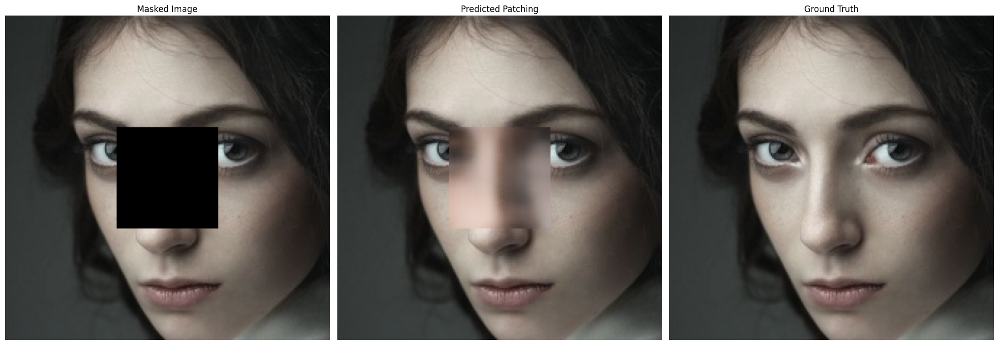

Model from trial 2


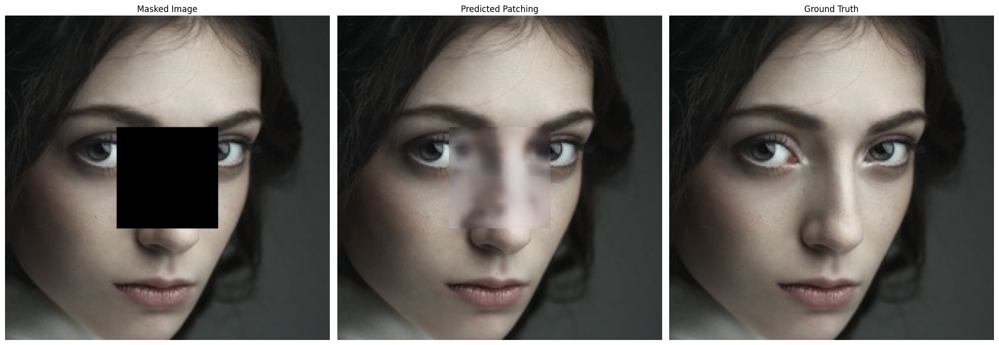

Model from trial 3


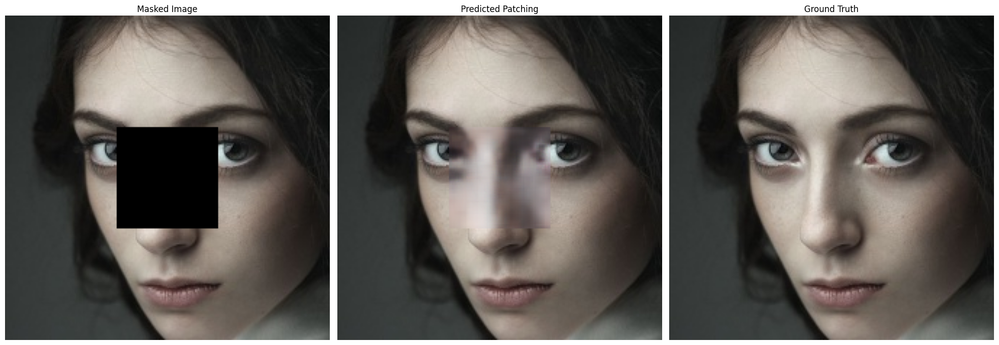

Model from trial 4


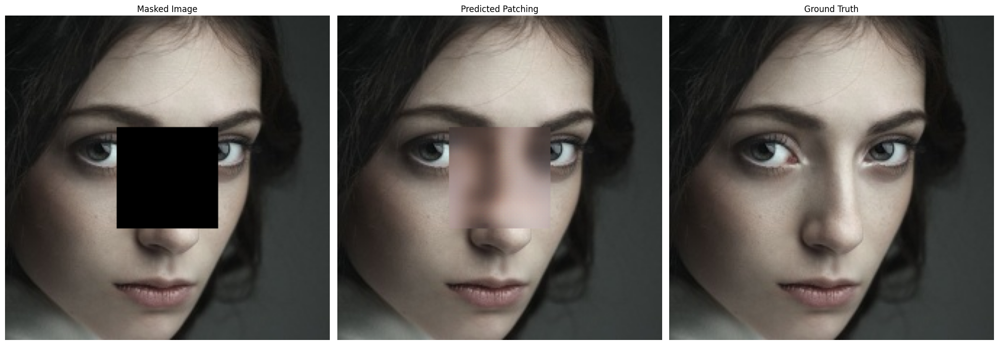

Model from trial 5


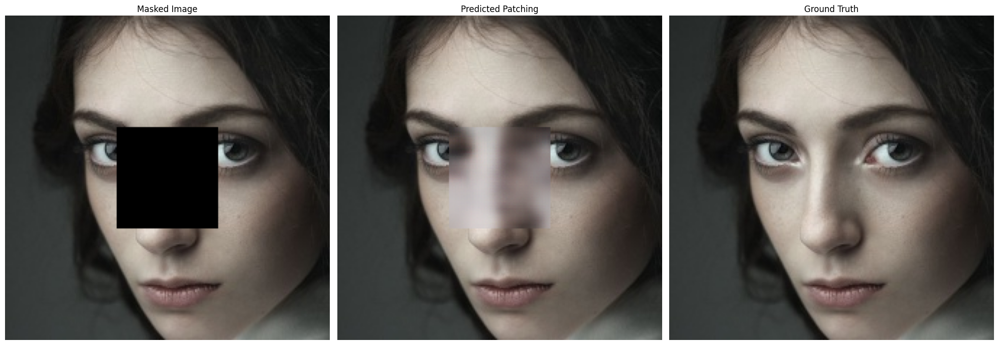

Model from trial 6


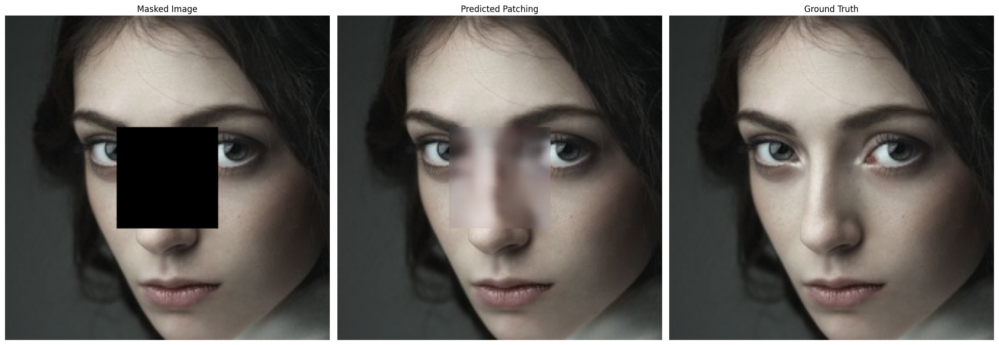

Model from trial 7


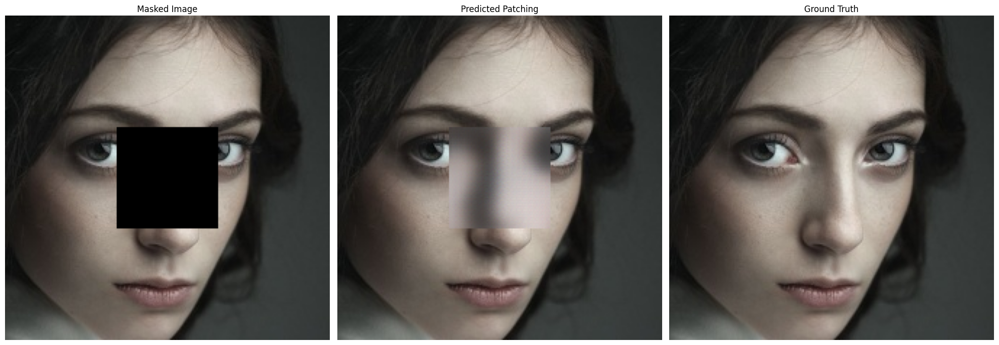

Model from trial 8


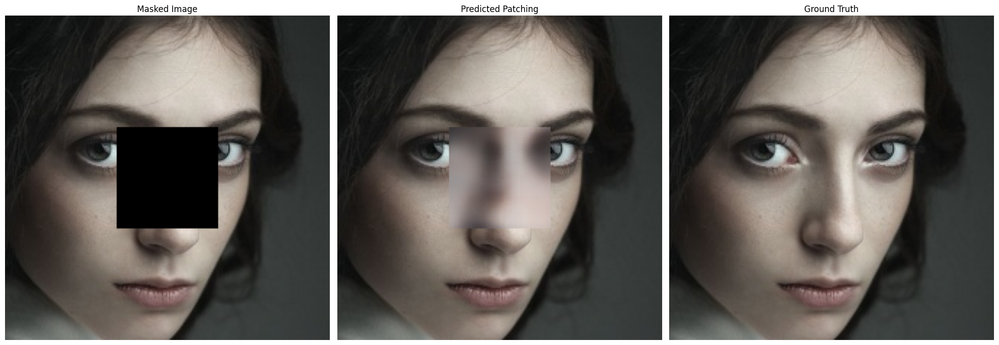

Model from trial 9


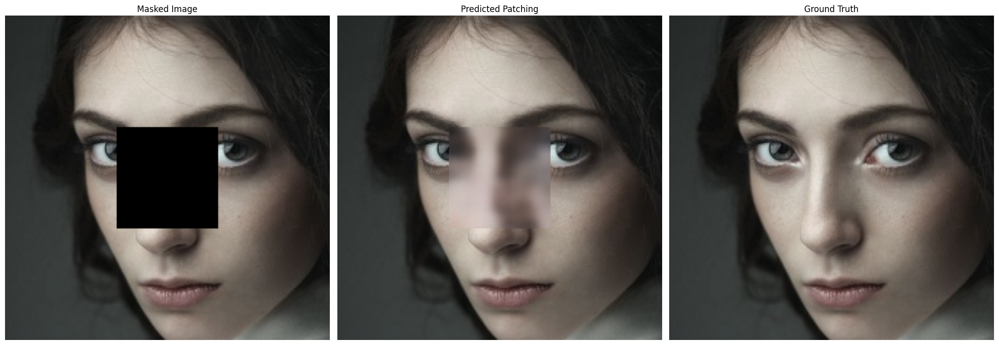

Model from trial 10


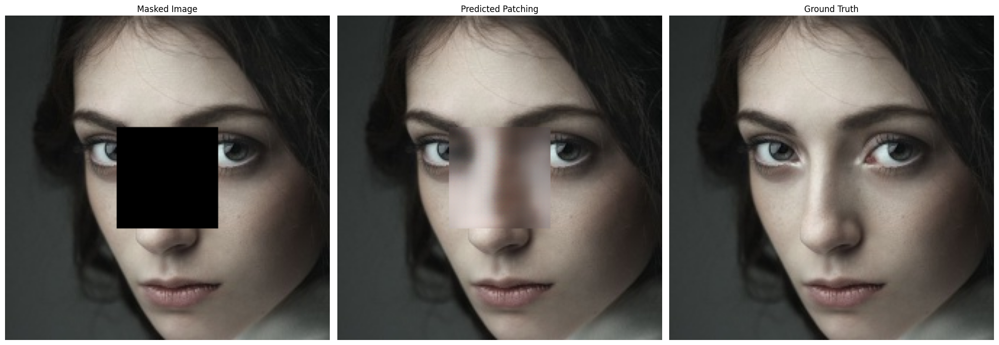

Model from trial 11


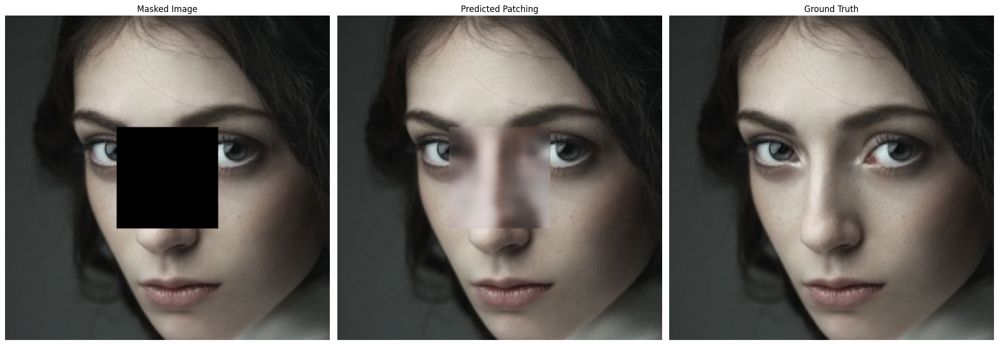

Model from trial 12


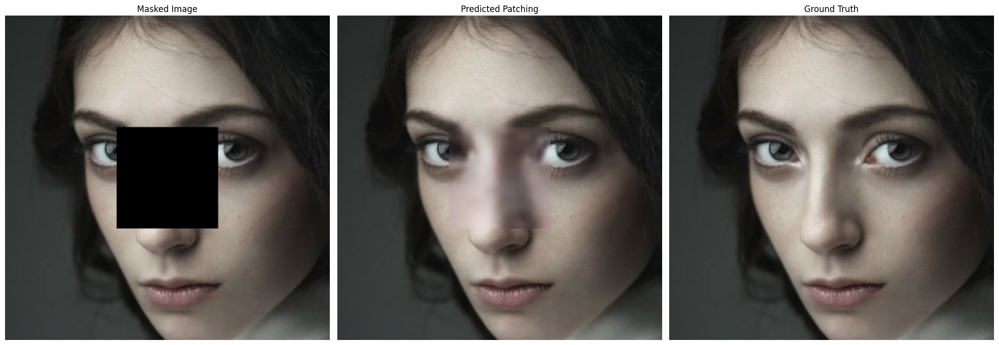

Model from trial 13


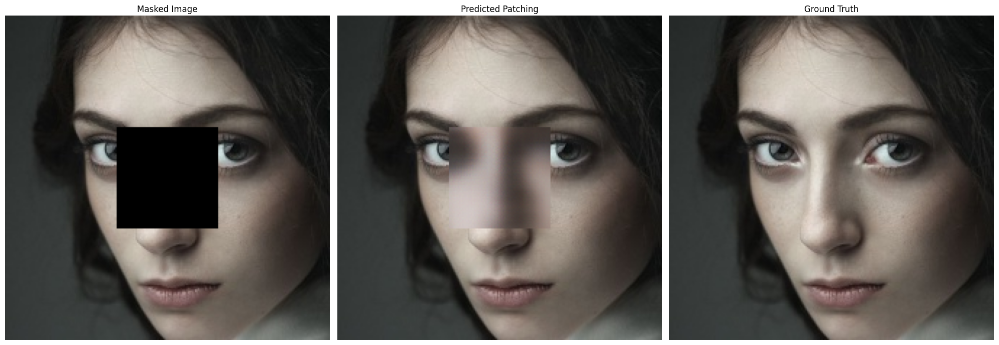

Model from trial 14


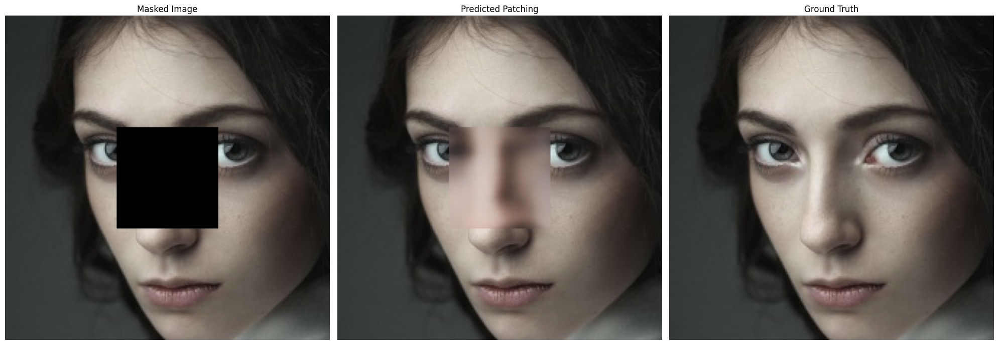

Model from trial 15


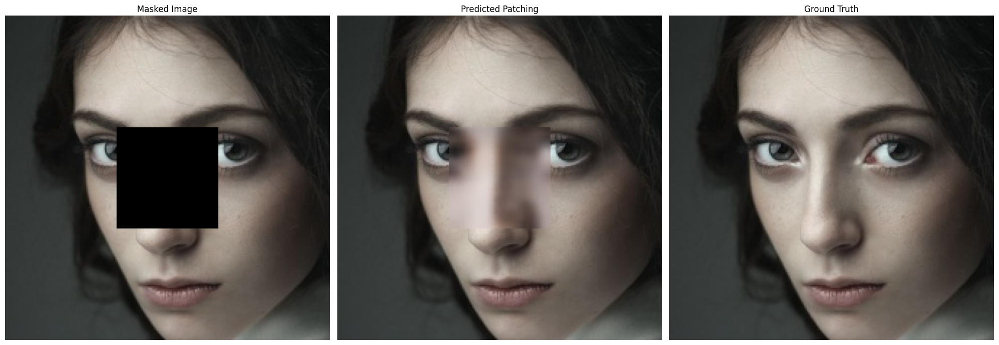

Model from trial 16


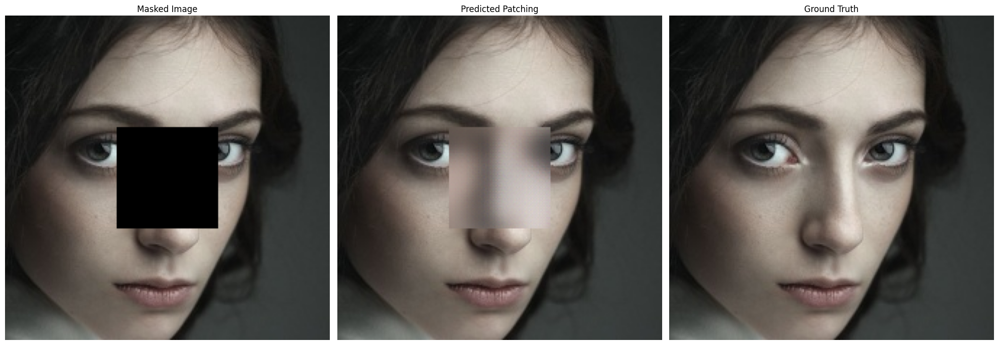

Model from trial 17


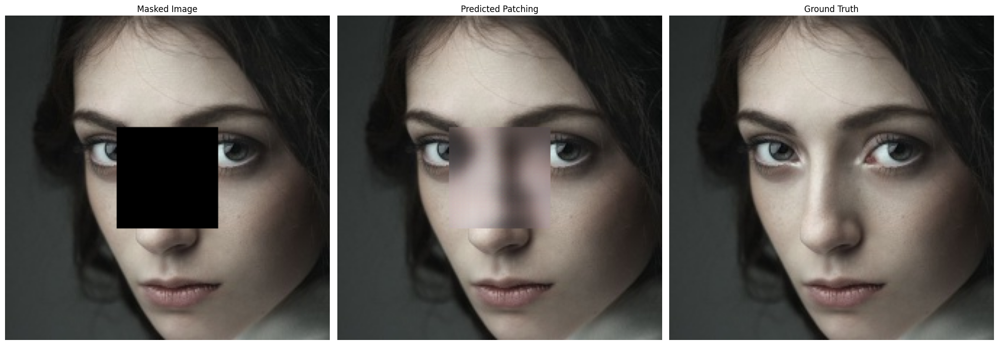

Model from trial 18


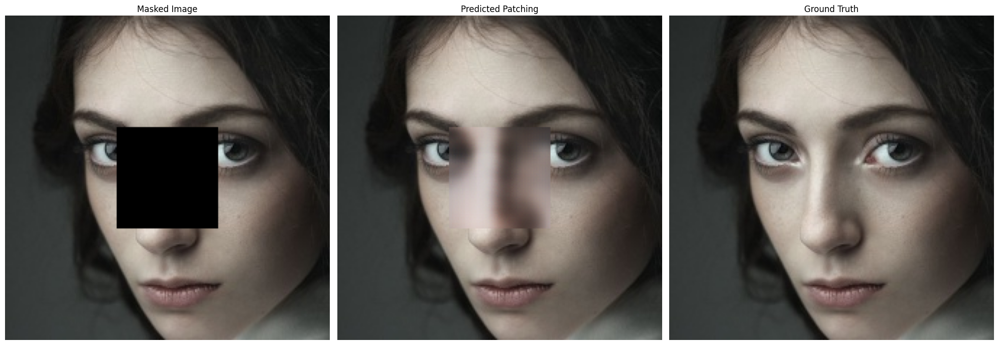

In [59]:
for i in range(len(model_list)):    
    print("Model from trial", i+1)
    check_model_and_prediction(model_list[i], 1, 3)

In [60]:
#Overfitting occurs in all models. Try to apply dropout to best one
#Recreated RESNET Encoder with dropout
class ResNetBlock(nn.Module):
    def __init__(self, in_channel, out_channel, padding, downsample, batch_norm):
        super(ResNetBlock, self).__init__()
        if(downsample):
            temp_stride = 2
        else:
            temp_stride = 1
        self.batchnorm_bool = batch_norm
        self.outchannel = out_channel
        
        
        self.conv_a = nn.Conv2d(in_channel, out_channel, kernel_size = (3,3), stride = temp_stride, padding = padding)
        nn.init.kaiming_normal_(self.conv_a.weight, mode='fan_out', nonlinearity='relu')

        self.conv_b = nn.Conv2d(out_channel, out_channel, kernel_size = (3,3), stride = 1, padding = padding)
        nn.init.kaiming_normal_(self.conv_b.weight, mode='fan_out', nonlinearity='relu')

        self.conv_short = nn.Conv2d(in_channel, out_channel, kernel_size = (1,1),  stride = temp_stride)
        nn.init.kaiming_normal_(self.conv_short.weight, mode='fan_out', nonlinearity='relu')

        self.relu = nn.ReLU(inplace=True)
        self.batchnorm_a = nn.BatchNorm2d(out_channel)
        self.batchnorm_b = nn.BatchNorm2d(out_channel)
        self.batchnorm_short = nn.BatchNorm2d(out_channel)
        
        
        
    def forward(self, x):
        old_x = x
        
        a_output=self.conv_a(x)
        if self.batchnorm_bool: a_output=self.batchnorm_a(a_output)
        a_output = self.relu(a_output)
        
        b_output = self.conv_b(a_output)
        if self.batchnorm_bool: b_output=self.batchnorm_b(b_output)
        b_output = self.relu(b_output)
        
        if(self.outchannel == 64):
            residual =  x
        else:
            residual =  self.conv_short(old_x)
        if self.batchnorm_bool: residual=self.batchnorm_short(residual)
        #print(b_output.size())
        #print(residual.size())
        out = self.relu(b_output + residual)
        return out



class ChannelWiseFullyConnected(nn.Module):
    def __init__(self, channels, height, width):
        super(ChannelWiseFullyConnected, self).__init__()
        self.channels = channels
        self.height = height
        self.width = width
        self.num_features = height * width
        
        # One independent linear layer per channel (each maps n^2 -> n^2)
        self.fc_layers = nn.ModuleList([
            nn.Linear(self.num_features, self.num_features) for _ in range(channels)
        ])
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, x):
        # x shape: [batch_size, channels, height, width]
        batch_size = x.size(0)
        
        out = []
        for c in range(self.channels):
            # Flatten H x W into a vector
            channel = x[:, c, :, :].view(batch_size, -1)
            # Apply channel-specific FC layer
            channel_fc = self.fc_layers[c](channel)
            channel_fc = self.dropout(channel_fc)
            # Reshape back to H x W
            channel_fc = channel_fc.view(batch_size, self.height, self.width)
            out.append(channel_fc.unsqueeze(1))  # add back channel dim
        
        # Concatenate channels back: shape [batch_size, channels, height, width]
        return torch.cat(out, dim=1)


# Custom ResNet34 Encoder (Manual Implementation)
class ResNetEncoder(nn.Module):
    def __init__(self, latent_dim=512):
        super(ResNetEncoder, self).__init__()

         # Encoder (Rest 
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        """
        self.rest_of_encoder = nn.Sequential(
            #CONV LAYER 2
            ResNetBlock(64, 64, 1, True, True),
            ResNetBlock(64, 64, 1, False, True),
            ResNetBlock(64, 64, 1, False, True),
    
            #CONV LAYER 3
            ResNetBlock(64, 128, 1, True, True),
            ResNetBlock(128, 128, 1, False, True),
            ResNetBlock(128, 128, 1, False, True),
            ResNetBlock(128, 128, 1, False, True),
    
            #CONV LAYER 4
            ResNetBlock(128, 256, 1, True, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
            ResNetBlock(256, 256, 1, False, True),
    
            #CONV LAYER 5
            ResNetBlock(256, 512, 1, True, True),
            ResNetBlock(512, 512, 1, False, True),
            ResNetBlock(512, 512, 1, False, True),
        )
        """
        
        """
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        """
        # ResNet34 layers

        #CONV LAYER 2
        self.conv2_1 = ResNetBlock(64, 64, 1, False, True)
        self.conv2_2 = ResNetBlock(64, 64, 1, False, True)
        self.conv2_3 = ResNetBlock(64, 64, 1, False, True)

        #CONV LAYER 3
        self.conv3_1 = ResNetBlock(64, 128, 1, True, True)
        self.conv3_2 = ResNetBlock(128, 128, 1, False, True)
        self.conv3_3 = ResNetBlock(128, 128, 1, False, True)
        self.conv3_4 = ResNetBlock(128, 128, 1, False, True)

        #CONV LAYER 4
        self.conv4_1 = ResNetBlock(128, 256, 1, True, True)
        self.conv4_2 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_3 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_4 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_5 = ResNetBlock(256, 256, 1, False, True)
        self.conv4_6 = ResNetBlock(256, 256, 1, False, True)

        #CONV LAYER 5
        self.conv5_1 = ResNetBlock(256, 512, 1, True, True)
        self.conv5_2 = ResNetBlock(512, 512, 1, False, True)
        self.conv5_3 = ResNetBlock(512, 512, 1, False, True)
        
        
        self.channel_fc = ChannelWiseFullyConnected(channels=512, height=7, width=7)
        self.conv_fc = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0)
        
        
        
        # Decoder (Upsampling to reconstruct image)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Output range [0,1]
        )
    
    def forward(self, x):
        # Encoder
        #print(x.size())
        x = self.conv1(x)
        #print(x.size())
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        #print(x.size())
        layer_2 = self.conv2_3(self.conv2_2(self.conv2_1(x)))
        layer_3 = self.conv3_4(self.conv3_3(self.conv3_2(self.conv3_1(layer_2))))
        layer_4 = self.conv4_6(self.conv4_5(self.conv4_4(self.conv4_3(self.conv4_2(self.conv4_1(layer_3))))))
        layer_5 = self.conv5_3(self.conv5_2(self.conv5_1(layer_4)))
        #raise RuntimeError(f"{layer_5.size()}")
        #x = self.rest_of_encoder(x)
        cfc = self.conv_fc(self.channel_fc(layer_5))
        # Decoder
        out = self.decoder(cfc)  # Convert features back to an image
        return out

Progress on Epoch 1: 100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


Epoch [1/10], Training Loss: 0.0414, Validation Loss: 0.0261


Progress on Epoch 2: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [2/10], Training Loss: 0.0250, Validation Loss: 0.0223


Progress on Epoch 3: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [3/10], Training Loss: 0.0221, Validation Loss: 0.0203


Progress on Epoch 4: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [4/10], Training Loss: 0.0206, Validation Loss: 0.0188


Progress on Epoch 5: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [5/10], Training Loss: 0.0194, Validation Loss: 0.0185


Progress on Epoch 6: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [6/10], Training Loss: 0.0187, Validation Loss: 0.0179


Progress on Epoch 7: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [7/10], Training Loss: 0.0181, Validation Loss: 0.0167


Progress on Epoch 8: 100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


Epoch [8/10], Training Loss: 0.0175, Validation Loss: 0.0181


Progress on Epoch 9: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [9/10], Training Loss: 0.0171, Validation Loss: 0.0162


Progress on Epoch 10: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [10/10], Training Loss: 0.0167, Validation Loss: 0.0160
Training Complete!


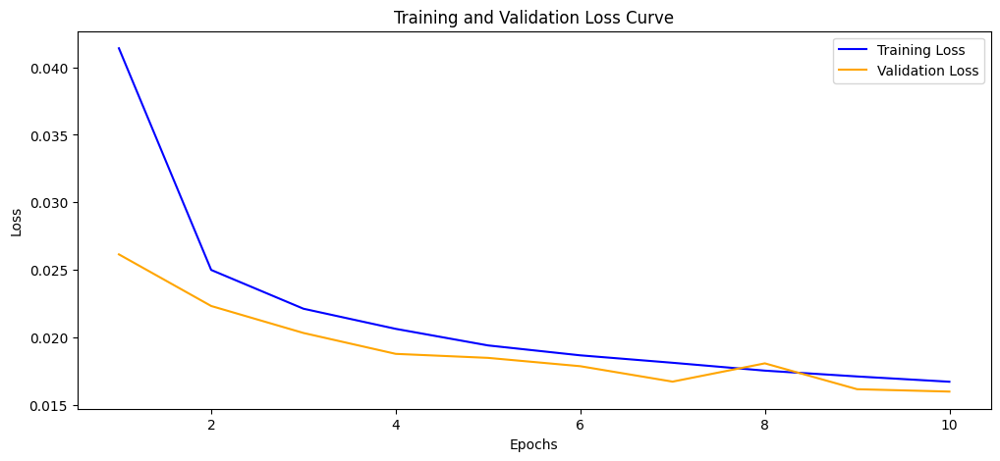

Model saved to ./model_paths/resnet34updated_lr0.0001_epoch9_batch64_trial.pth, cleaning required


Progress on Epoch 1: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [1/25], Training Loss: 0.0432, Validation Loss: 0.0261


Progress on Epoch 2: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [2/25], Training Loss: 0.0250, Validation Loss: 0.0240


Progress on Epoch 3: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [3/25], Training Loss: 0.0220, Validation Loss: 0.0224


Progress on Epoch 4: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [4/25], Training Loss: 0.0204, Validation Loss: 0.0185


Progress on Epoch 5: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [5/25], Training Loss: 0.0194, Validation Loss: 0.0184


Progress on Epoch 6: 100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


Epoch [6/25], Training Loss: 0.0187, Validation Loss: 0.0185


Progress on Epoch 7: 100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


Epoch [7/25], Training Loss: 0.0179, Validation Loss: 0.0169


Progress on Epoch 8: 100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


Epoch [8/25], Training Loss: 0.0175, Validation Loss: 0.0163


Progress on Epoch 9: 100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


Epoch [9/25], Training Loss: 0.0170, Validation Loss: 0.0158


Progress on Epoch 10: 100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


Epoch [10/25], Training Loss: 0.0164, Validation Loss: 0.0156


Progress on Epoch 11: 100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


Epoch [11/25], Training Loss: 0.0163, Validation Loss: 0.0157


Progress on Epoch 12: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [12/25], Training Loss: 0.0160, Validation Loss: 0.0152


Progress on Epoch 13: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [13/25], Training Loss: 0.0157, Validation Loss: 0.0152


Progress on Epoch 14: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [14/25], Training Loss: 0.0153, Validation Loss: 0.0150


Progress on Epoch 15: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [15/25], Training Loss: 0.0150, Validation Loss: 0.0150


Progress on Epoch 16: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [16/25], Training Loss: 0.0148, Validation Loss: 0.0146


Progress on Epoch 17: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [17/25], Training Loss: 0.0147, Validation Loss: 0.0139


Progress on Epoch 18: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [18/25], Training Loss: 0.0145, Validation Loss: 0.0162


Progress on Epoch 19: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [19/25], Training Loss: 0.0145, Validation Loss: 0.0138


Progress on Epoch 20: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [20/25], Training Loss: 0.0141, Validation Loss: 0.0139


Progress on Epoch 21: 100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


Epoch [21/25], Training Loss: 0.0137, Validation Loss: 0.0130


Progress on Epoch 22: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [22/25], Training Loss: 0.0138, Validation Loss: 0.0131


Progress on Epoch 23: 100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


Epoch [23/25], Training Loss: 0.0134, Validation Loss: 0.0134


Progress on Epoch 24: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [24/25], Training Loss: 0.0132, Validation Loss: 0.0130


Progress on Epoch 25: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [25/25], Training Loss: 0.0131, Validation Loss: 0.0129
Training Complete!


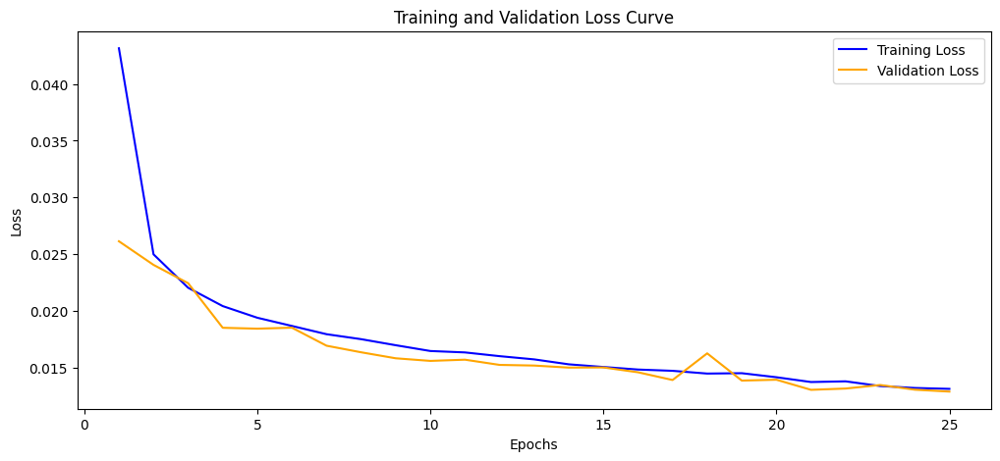

Model saved to ./model_paths/resnet34updated_lr0.0001_epoch24_batch64_trial.pth, cleaning required


Progress on Epoch 1: 100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


Epoch [1/50], Training Loss: 0.0426, Validation Loss: 0.0253


Progress on Epoch 2: 100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


Epoch [2/50], Training Loss: 0.0247, Validation Loss: 0.0214


Progress on Epoch 3: 100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


Epoch [3/50], Training Loss: 0.0219, Validation Loss: 0.0197


Progress on Epoch 4: 100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


Epoch [4/50], Training Loss: 0.0204, Validation Loss: 0.0202


Progress on Epoch 5: 100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


Epoch [5/50], Training Loss: 0.0193, Validation Loss: 0.0188


Progress on Epoch 6: 100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


Epoch [6/50], Training Loss: 0.0187, Validation Loss: 0.0179


Progress on Epoch 7: 100%|██████████| 238/238 [03:43<00:00,  1.07it/s]


Epoch [7/50], Training Loss: 0.0182, Validation Loss: 0.0170


Progress on Epoch 8: 100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


Epoch [8/50], Training Loss: 0.0176, Validation Loss: 0.0227


Progress on Epoch 9: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [9/50], Training Loss: 0.0175, Validation Loss: 0.0163


Progress on Epoch 10: 100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


Epoch [10/50], Training Loss: 0.0168, Validation Loss: 0.0160


Progress on Epoch 11: 100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


Epoch [11/50], Training Loss: 0.0165, Validation Loss: 0.0158


Progress on Epoch 12: 100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


Epoch [12/50], Training Loss: 0.0161, Validation Loss: 0.0149


Progress on Epoch 13: 100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


Epoch [13/50], Training Loss: 0.0158, Validation Loss: 0.0155


Progress on Epoch 14: 100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


Epoch [14/50], Training Loss: 0.0156, Validation Loss: 0.0145


Progress on Epoch 15: 100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


Epoch [15/50], Training Loss: 0.0152, Validation Loss: 0.0145


Progress on Epoch 16: 100%|██████████| 238/238 [03:25<00:00,  1.16it/s]


Epoch [16/50], Training Loss: 0.0150, Validation Loss: 0.0142


Progress on Epoch 17: 100%|██████████| 238/238 [03:25<00:00,  1.16it/s]


Epoch [17/50], Training Loss: 0.0149, Validation Loss: 0.0142


Progress on Epoch 18: 100%|██████████| 238/238 [03:24<00:00,  1.17it/s]


Epoch [18/50], Training Loss: 0.0146, Validation Loss: 0.0147


Progress on Epoch 19: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [19/50], Training Loss: 0.0143, Validation Loss: 0.0139


Progress on Epoch 20: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [20/50], Training Loss: 0.0141, Validation Loss: 0.0136


Progress on Epoch 21: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [21/50], Training Loss: 0.0140, Validation Loss: 0.0147


Progress on Epoch 22: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [22/50], Training Loss: 0.0136, Validation Loss: 0.0131


Progress on Epoch 23: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [23/50], Training Loss: 0.0135, Validation Loss: 0.0130


Progress on Epoch 24: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [24/50], Training Loss: 0.0135, Validation Loss: 0.0131


Progress on Epoch 25: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [25/50], Training Loss: 0.0132, Validation Loss: 0.0125


Progress on Epoch 26: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [26/50], Training Loss: 0.0130, Validation Loss: 0.0126


Progress on Epoch 27: 100%|██████████| 238/238 [03:24<00:00,  1.17it/s]


Epoch [27/50], Training Loss: 0.0128, Validation Loss: 0.0127


Progress on Epoch 28: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [28/50], Training Loss: 0.0127, Validation Loss: 0.0124


Progress on Epoch 29: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [29/50], Training Loss: 0.0125, Validation Loss: 0.0124


Progress on Epoch 30: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [30/50], Training Loss: 0.0124, Validation Loss: 0.0121


Progress on Epoch 31: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [31/50], Training Loss: 0.0122, Validation Loss: 0.0119


Progress on Epoch 32: 100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


Epoch [32/50], Training Loss: 0.0121, Validation Loss: 0.0119


Progress on Epoch 33: 100%|██████████| 238/238 [03:26<00:00,  1.16it/s]


Epoch [33/50], Training Loss: 0.0121, Validation Loss: 0.0120


Progress on Epoch 34: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [34/50], Training Loss: 0.0119, Validation Loss: 0.0117


Progress on Epoch 35: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [35/50], Training Loss: 0.0118, Validation Loss: 0.0112


Progress on Epoch 36: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [36/50], Training Loss: 0.0117, Validation Loss: 0.0118


Progress on Epoch 37: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [37/50], Training Loss: 0.0117, Validation Loss: 0.0116


Progress on Epoch 38: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [38/50], Training Loss: 0.0115, Validation Loss: 0.0112


Progress on Epoch 39: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [39/50], Training Loss: 0.0113, Validation Loss: 0.0110


Progress on Epoch 40: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [40/50], Training Loss: 0.0113, Validation Loss: 0.0113


Progress on Epoch 41: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [41/50], Training Loss: 0.0112, Validation Loss: 0.0110


Progress on Epoch 42: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [42/50], Training Loss: 0.0111, Validation Loss: 0.0108


Progress on Epoch 43: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [43/50], Training Loss: 0.0109, Validation Loss: 0.0109


Progress on Epoch 44: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [44/50], Training Loss: 0.0109, Validation Loss: 0.0108


Progress on Epoch 45: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [45/50], Training Loss: 0.0109, Validation Loss: 0.0106


Progress on Epoch 46: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [46/50], Training Loss: 0.0109, Validation Loss: 0.0105


Progress on Epoch 47: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [47/50], Training Loss: 0.0107, Validation Loss: 0.0104


Progress on Epoch 48: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [48/50], Training Loss: 0.0106, Validation Loss: 0.0102


Progress on Epoch 49: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [49/50], Training Loss: 0.0105, Validation Loss: 0.0102


Progress on Epoch 50: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [50/50], Training Loss: 0.0105, Validation Loss: 0.0105
Training Complete!


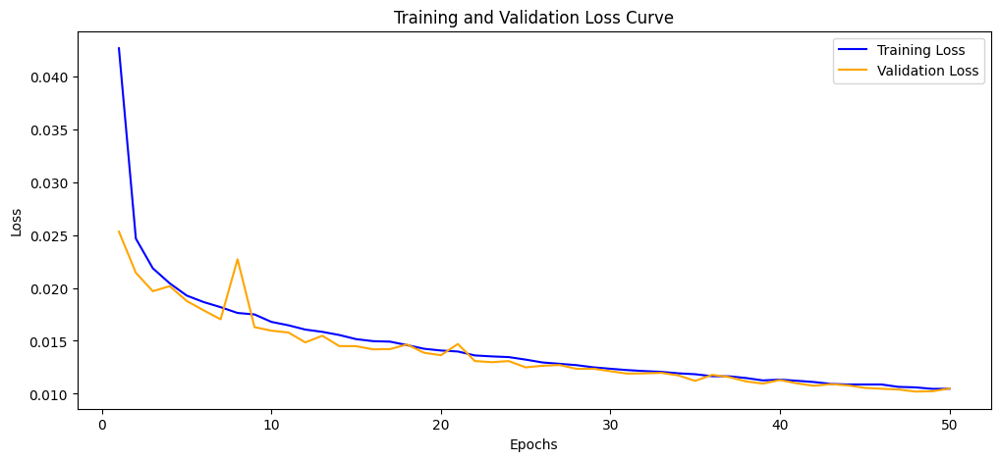

Model saved to ./model_paths/resnet34updated_lr0.0001_epoch49_batch64_trial.pth, cleaning required


Progress on Epoch 1: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [1/10], Training Loss: 0.0495, Validation Loss: 0.0341


Progress on Epoch 2: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [2/10], Training Loss: 0.0277, Validation Loss: 0.0246


Progress on Epoch 3: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [3/10], Training Loss: 0.0245, Validation Loss: 0.0221


Progress on Epoch 4: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [4/10], Training Loss: 0.0228, Validation Loss: 0.0206


Progress on Epoch 5: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [5/10], Training Loss: 0.0215, Validation Loss: 0.0199


Progress on Epoch 6: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [6/10], Training Loss: 0.0206, Validation Loss: 0.0194


Progress on Epoch 7: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [7/10], Training Loss: 0.0202, Validation Loss: 0.0186


Progress on Epoch 8: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [8/10], Training Loss: 0.0194, Validation Loss: 0.0183


Progress on Epoch 9: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [9/10], Training Loss: 0.0187, Validation Loss: 0.0183


Progress on Epoch 10: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [10/10], Training Loss: 0.0184, Validation Loss: 0.0173
Training Complete!


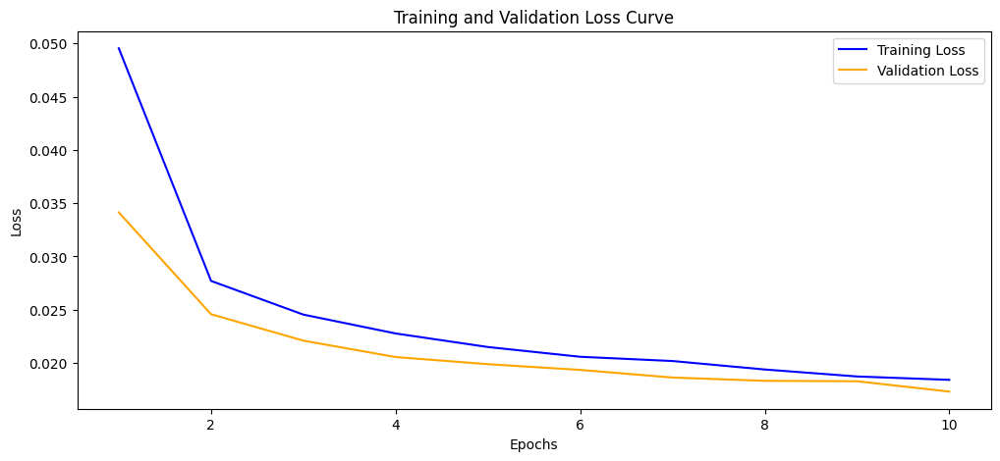

Model saved to ./model_paths/resnet34updated_lr5e-05_epoch9_batch64_trial.pth, cleaning required


Progress on Epoch 1: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [1/25], Training Loss: 0.0493, Validation Loss: 0.0366


Progress on Epoch 2: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [2/25], Training Loss: 0.0283, Validation Loss: 0.0253


Progress on Epoch 3: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [3/25], Training Loss: 0.0247, Validation Loss: 0.0230


Progress on Epoch 4: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [4/25], Training Loss: 0.0232, Validation Loss: 0.0218


Progress on Epoch 5: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [5/25], Training Loss: 0.0221, Validation Loss: 0.0205


Progress on Epoch 6: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [6/25], Training Loss: 0.0214, Validation Loss: 0.0196


Progress on Epoch 7: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [7/25], Training Loss: 0.0202, Validation Loss: 0.0185


Progress on Epoch 8: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [8/25], Training Loss: 0.0196, Validation Loss: 0.0179


Progress on Epoch 9: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [9/25], Training Loss: 0.0190, Validation Loss: 0.0180


Progress on Epoch 10: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [10/25], Training Loss: 0.0185, Validation Loss: 0.0174


Progress on Epoch 11: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [11/25], Training Loss: 0.0181, Validation Loss: 0.0173


Progress on Epoch 12: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [12/25], Training Loss: 0.0177, Validation Loss: 0.0167


Progress on Epoch 13: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [13/25], Training Loss: 0.0175, Validation Loss: 0.0164


Progress on Epoch 14: 100%|██████████| 238/238 [03:25<00:00,  1.16it/s]


Epoch [14/25], Training Loss: 0.0171, Validation Loss: 0.0160


Progress on Epoch 15: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [15/25], Training Loss: 0.0170, Validation Loss: 0.0161


Progress on Epoch 16: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [16/25], Training Loss: 0.0166, Validation Loss: 0.0160


Progress on Epoch 17: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [17/25], Training Loss: 0.0164, Validation Loss: 0.0158


Progress on Epoch 18: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [18/25], Training Loss: 0.0162, Validation Loss: 0.0155


Progress on Epoch 19: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [19/25], Training Loss: 0.0160, Validation Loss: 0.0152


Progress on Epoch 20: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [20/25], Training Loss: 0.0157, Validation Loss: 0.0219


Progress on Epoch 21: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [21/25], Training Loss: 0.0158, Validation Loss: 0.0152


Progress on Epoch 22: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [22/25], Training Loss: 0.0154, Validation Loss: 0.0147


Progress on Epoch 23: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [23/25], Training Loss: 0.0153, Validation Loss: 0.0145


Progress on Epoch 24: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [24/25], Training Loss: 0.0151, Validation Loss: 0.0145


Progress on Epoch 25: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [25/25], Training Loss: 0.0149, Validation Loss: 0.0145
Training Complete!


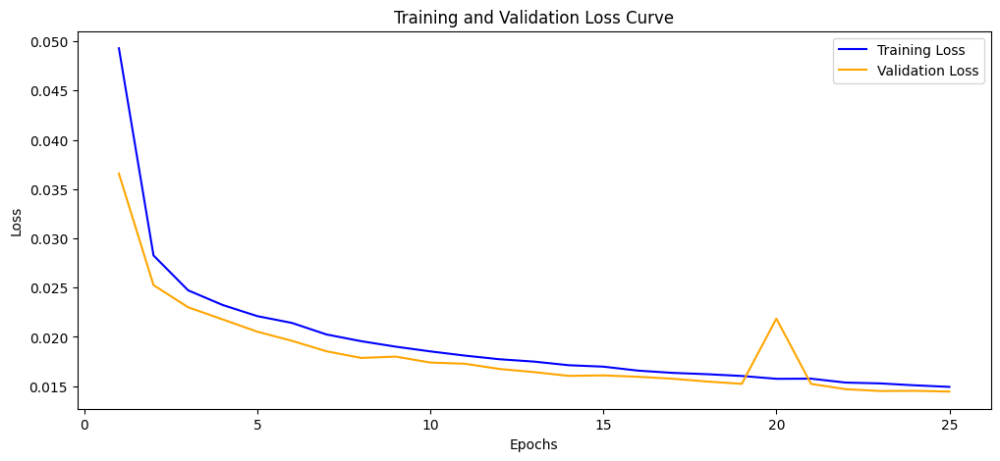

Model saved to ./model_paths/resnet34updated_lr5e-05_epoch24_batch64_trial.pth, cleaning required


Progress on Epoch 1: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [1/50], Training Loss: 0.0483, Validation Loss: 0.0327


Progress on Epoch 2: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [2/50], Training Loss: 0.0281, Validation Loss: 0.0247


Progress on Epoch 3: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [3/50], Training Loss: 0.0249, Validation Loss: 0.0226


Progress on Epoch 4: 100%|██████████| 238/238 [03:20<00:00,  1.18it/s]


Epoch [4/50], Training Loss: 0.0229, Validation Loss: 0.0208


Progress on Epoch 5: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [5/50], Training Loss: 0.0217, Validation Loss: 0.0199


Progress on Epoch 6: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [6/50], Training Loss: 0.0208, Validation Loss: 0.0192


Progress on Epoch 7: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [7/50], Training Loss: 0.0201, Validation Loss: 0.0185


Progress on Epoch 8: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [8/50], Training Loss: 0.0194, Validation Loss: 0.0191


Progress on Epoch 9: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [9/50], Training Loss: 0.0189, Validation Loss: 0.0181


Progress on Epoch 10: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [10/50], Training Loss: 0.0186, Validation Loss: 0.0172


Progress on Epoch 11: 100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


Epoch [11/50], Training Loss: 0.0182, Validation Loss: 0.0171


Progress on Epoch 12: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [12/50], Training Loss: 0.0178, Validation Loss: 0.0169


Progress on Epoch 13: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [13/50], Training Loss: 0.0175, Validation Loss: 0.0167


Progress on Epoch 14: 100%|██████████| 238/238 [03:20<00:00,  1.18it/s]


Epoch [14/50], Training Loss: 0.0171, Validation Loss: 0.0165


Progress on Epoch 15: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [15/50], Training Loss: 0.0168, Validation Loss: 0.0161


Progress on Epoch 16: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [16/50], Training Loss: 0.0167, Validation Loss: 0.0158


Progress on Epoch 17: 100%|██████████| 238/238 [03:20<00:00,  1.18it/s]


Epoch [17/50], Training Loss: 0.0164, Validation Loss: 0.0165


Progress on Epoch 18: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [18/50], Training Loss: 0.0163, Validation Loss: 0.0157


Progress on Epoch 19: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [19/50], Training Loss: 0.0162, Validation Loss: 0.0169


Progress on Epoch 20: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [20/50], Training Loss: 0.0159, Validation Loss: 0.0150


Progress on Epoch 21: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [21/50], Training Loss: 0.0156, Validation Loss: 0.0149


Progress on Epoch 22: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [22/50], Training Loss: 0.0154, Validation Loss: 0.0153


Progress on Epoch 23: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [23/50], Training Loss: 0.0154, Validation Loss: 0.0151


Progress on Epoch 24: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [24/50], Training Loss: 0.0153, Validation Loss: 0.0151


Progress on Epoch 25: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [25/50], Training Loss: 0.0151, Validation Loss: 0.0146


Progress on Epoch 26: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [26/50], Training Loss: 0.0147, Validation Loss: 0.0153


Progress on Epoch 27: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [27/50], Training Loss: 0.0148, Validation Loss: 0.0146


Progress on Epoch 28: 100%|██████████| 238/238 [03:24<00:00,  1.16it/s]


Epoch [28/50], Training Loss: 0.0145, Validation Loss: 0.0140


Progress on Epoch 29: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [29/50], Training Loss: 0.0144, Validation Loss: 0.0143


Progress on Epoch 30: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [30/50], Training Loss: 0.0141, Validation Loss: 0.0137


Progress on Epoch 31: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [31/50], Training Loss: 0.0141, Validation Loss: 0.0139


Progress on Epoch 32: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [32/50], Training Loss: 0.0140, Validation Loss: 0.0135


Progress on Epoch 33: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [33/50], Training Loss: 0.0140, Validation Loss: 0.0135


Progress on Epoch 34: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [34/50], Training Loss: 0.0137, Validation Loss: 0.0134


Progress on Epoch 35: 100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


Epoch [35/50], Training Loss: 0.0135, Validation Loss: 0.0137


Progress on Epoch 36: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [36/50], Training Loss: 0.0135, Validation Loss: 0.0137


Progress on Epoch 37: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [37/50], Training Loss: 0.0133, Validation Loss: 0.0133


Progress on Epoch 38: 100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


Epoch [38/50], Training Loss: 0.0133, Validation Loss: 0.0129


Progress on Epoch 39: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [39/50], Training Loss: 0.0131, Validation Loss: 0.0128


Progress on Epoch 40: 100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


Epoch [40/50], Training Loss: 0.0130, Validation Loss: 0.0128


Progress on Epoch 41: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [41/50], Training Loss: 0.0128, Validation Loss: 0.0129


Progress on Epoch 42: 100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


Epoch [42/50], Training Loss: 0.0128, Validation Loss: 0.0128


Progress on Epoch 43: 100%|██████████| 238/238 [03:20<00:00,  1.19it/s]


Epoch [43/50], Training Loss: 0.0127, Validation Loss: 0.0127


Progress on Epoch 44: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [44/50], Training Loss: 0.0127, Validation Loss: 0.0124


Progress on Epoch 45: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [45/50], Training Loss: 0.0125, Validation Loss: 0.0123


Progress on Epoch 46: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [46/50], Training Loss: 0.0126, Validation Loss: 0.0119


Progress on Epoch 47: 100%|██████████| 238/238 [03:20<00:00,  1.18it/s]


Epoch [47/50], Training Loss: 0.0123, Validation Loss: 0.0121


Progress on Epoch 48: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [48/50], Training Loss: 0.0122, Validation Loss: 0.0122


Progress on Epoch 49: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [49/50], Training Loss: 0.0122, Validation Loss: 0.0119


Progress on Epoch 50: 100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


Epoch [50/50], Training Loss: 0.0121, Validation Loss: 0.0120
Training Complete!


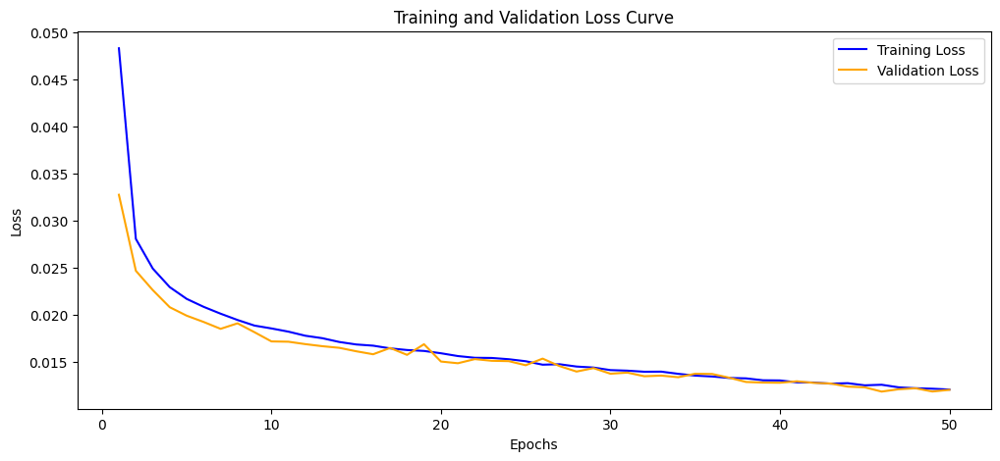

Model saved to ./model_paths/resnet34updated_lr5e-05_epoch49_batch64_trial.pth, cleaning required


In [65]:
#Retraining models with batch 64 and lower learning rates (since more images in a batch means less overfitting due to getting a specific set of features). The "best" model in terms of loss also has these parameters.
new_model_list = []
for lr in [0.0001, 0.00005]:
    for epoch in [10, 25, 50]:
        updated_train_loss, updated_validation_loss, updated_model = train_RESNET_ENCODER(lr=lr, epochs = epoch, batch_size = 64, add_to_path_string="updated")
        new_model_list.append(updated_model)

C:\Users\kirby\AppData\Local\Temp\ipykernel_40828\3363402751.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path)


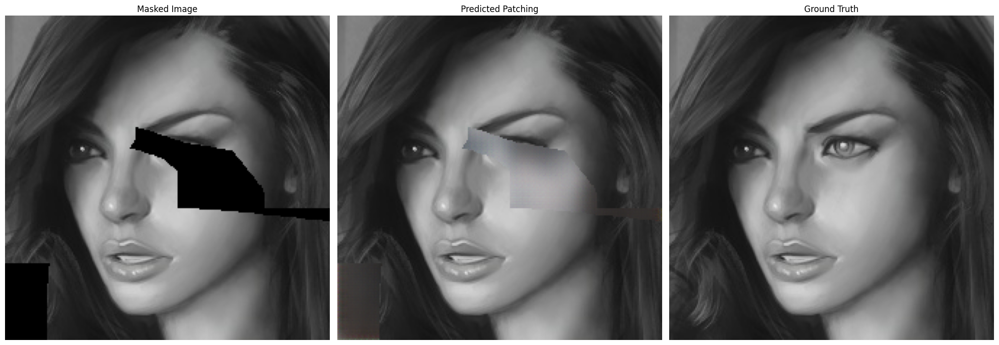

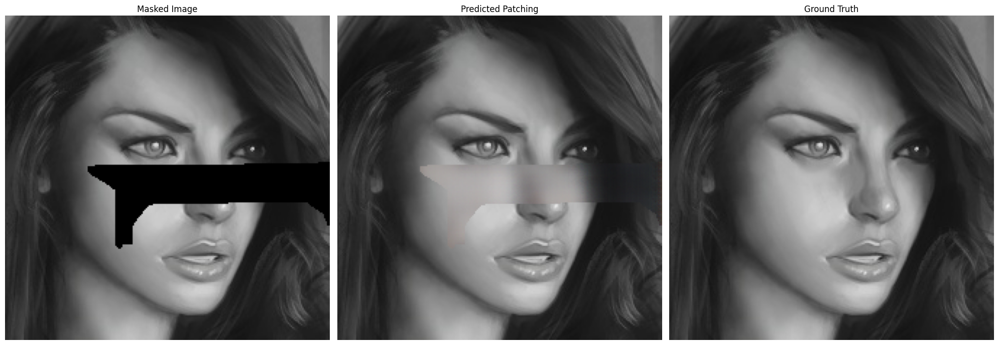

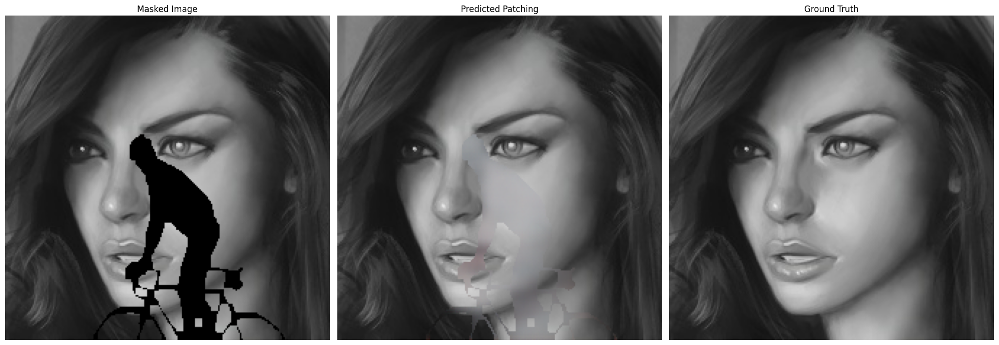

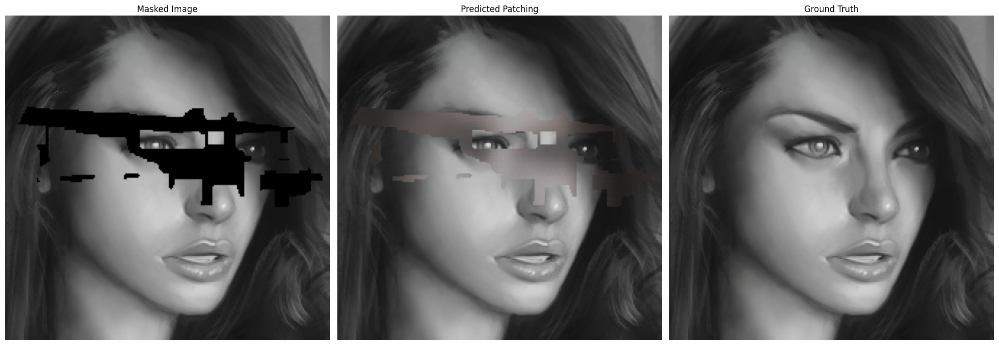

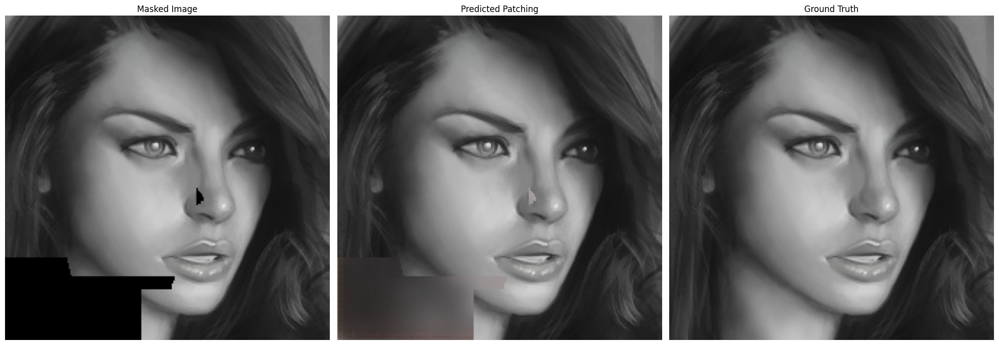

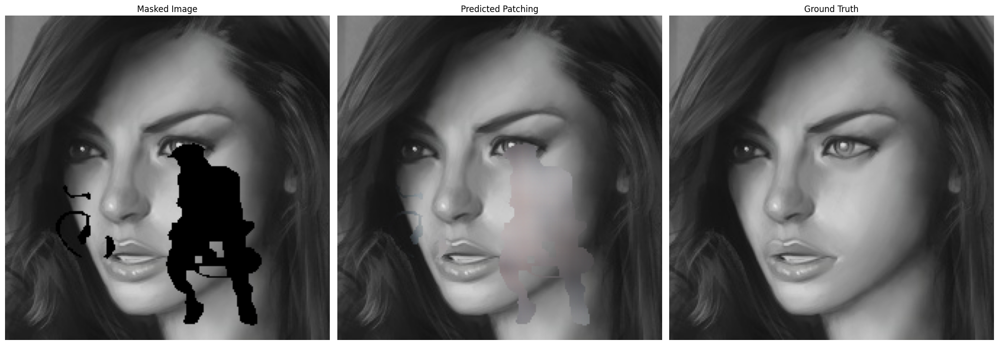

In [88]:
for path in new_model_list:
    check_model_and_prediction(path, 1, 22)